<a href="https://colab.research.google.com/github/dawsonblock/GWT-IB-Theorem-Visualizer/blob/INFINITY/tutorials/cartpole.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Setup rendering dependencies for Google Colaboratory.

In [ ]:
!apt-get install -y xvfb ffmpeg > /dev/null 2>&1
!pip install pyvirtualdisplay pygame moviepy > /dev/null 2>&1

Install d3rlpy!

In [ ]:
!pip install d3rlpy

Setup cartpole dataset.

In [ ]:
import d3rlpy

# get CartPole dataset
dataset, env = d3rlpy.datasets.get_cartpole()

Setup data-driven deep reinforcement learning algorithm.

In [ ]:
# setup CQL algorithm
cql = d3rlpy.algos.DiscreteCQLConfig().create(device='cuda:0')

# start training
cql.fit(
    dataset,
    n_steps=10000,
    n_steps_per_epoch=1000,
    evaluators={
        'environment': d3rlpy.metrics.EnvironmentEvaluator(env), # evaluate with CartPole-v1 environment
    },
)

Record video!

In [ ]:
import gym
from gym.wrappers import RecordVideo

# start virtual display
d3rlpy.notebook_utils.start_virtual_display()

# wrap RecordVideo wrapper
env = RecordVideo(gym.make("CartPole-v1", render_mode="rgb_array"), './video')

# evaluate
d3rlpy.metrics.evaluate_qlearning_with_environment(cql, env)

Let's see how it works!

In [ ]:
d3rlpy.notebook_utils.render_video("video/rl-video-episode-0.mp4")

In [1]:
import gymnasium as gym
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
import matplotlib.pyplot as plt
from tqdm.auto import trange

# ============================================================
# CONFIG
# ============================================================

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ENV_NAME = "CartPole-v1"

TRAIN_UPDATES = 250
ROLLOUT_LEN = 1024
EPOCHS = 4
BATCH = 64

EVAL_EPISODES = 20
NOISE_LEVELS = np.linspace(0.0, 1.0, 9)
TARGET_COMPUTE = 0.20
GAMMA = 0.99

# Early-stop thresholds
COLLAPSE_REWARD = 25.0     # CartPole collapse
PATIENCE = 15              # updates

torch.manual_seed(0)
np.random.seed(0)

# ============================================================
# BASELINE PPO
# ============================================================

class BaselinePPO(nn.Module):
    def __init__(self, obs_dim, act_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
        )
        self.pi = nn.Linear(64, act_dim)
        self.v  = nn.Linear(64, 1)

    def forward(self, x):
        h = self.net(x)
        return self.pi(h), self.v(h).squeeze(-1)

# ============================================================
# GWT-IB
# ============================================================

DIM_X, DIM_W = 128, 8

class GWTIB(nn.Module):
    def __init__(self, obs_dim, act_dim, target=0.2):
        super().__init__()

        self.light_enc = nn.Sequential(nn.Linear(obs_dim, DIM_X), nn.ReLU())
        self.light_dec = nn.Sequential(nn.Linear(DIM_X, obs_dim))

        self.heavy_enc = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, DIM_X),
            nn.ReLU(),
        )

        self.routing_scale = nn.Parameter(torch.tensor(10.0))
        self.routing_bias  = nn.Parameter(torch.tensor(-1.0))

        self.mu = nn.Linear(DIM_X, DIM_W)
        self.logvar = nn.Linear(DIM_X, DIM_W)

        self.gate = nn.Sequential(nn.Linear(DIM_W, DIM_W), nn.Sigmoid())
        self.pi = nn.Linear(DIM_W, act_dim)
        self.v  = nn.Linear(DIM_W, 1)

        self.log_alpha = nn.Parameter(torch.tensor(-2.3))
        self.register_buffer("ema_c", torch.tensor(0.0))
        self.target = target

    def forward(self, o, corrupt=False, noise_std=0.0):
        o_raw = o

        x_light = self.light_enc(o_raw)
        o_rec = self.light_dec(x_light)

        rec_err = ((o_raw - o_rec) ** 2).mean(dim=-1)
        rec_err = torch.clamp(rec_err, max=5.0)

        r = rec_err.detach() * self.routing_scale + self.routing_bias
        c = torch.sigmoid(r)

        if corrupt:
            o = o_raw + noise_std * torch.randn_like(o_raw)
        else:
            o = o_raw

        x = (1 - c.unsqueeze(-1)) * self.light_enc(o) \
            + c.unsqueeze(-1) * self.heavy_enc(o)

        mu, logvar = self.mu(x), self.logvar(x).clamp(-6, 4)

        if self.training:
            w = mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)
        else:
            w = mu

        w_eff = w * (1 - self.gate(w))
        return self.pi(w_eff), self.v(w_eff).squeeze(-1), c, o_rec

    def budget_loss(self, c):
        alpha = self.log_alpha.clamp(-6, 3).exp()
        self.ema_c = 0.99 * self.ema_c + 0.01 * c.mean().detach()
        constraint = self.ema_c - self.target
        return alpha.detach() * c.mean() + alpha * constraint

# ============================================================
# TRAINING WITH NESTED PROGRESS + LIVE METRICS + EARLY STOP
# ============================================================

def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    collapse_counter = 0
    reward_ema = None

    for update in trange(
        TRAIN_UPDATES,
        desc=f"Training {model.__class__.__name__}",
        leave=True
    ):
        obs,_ = env.reset()
        traj = []
        ep_return = 0.0

        for _ in trange(
            ROLLOUT_LEN,
            desc="Rollout",
            leave=False
        ):
            o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)

            if baseline:
                logits, v = model(o)
                c, o_rec = None, None
            else:
                logits, v, c, o_rec = model(o)

            dist = D.Categorical(logits=logits)
            a = dist.sample()

            obs2, r, term, trunc,_ = env.step(a.item())
            traj.append((o, a, r, v, dist.log_prob(a), c, o_rec))
            ep_return += r
            obs = obs2 if not (term or trunc) else env.reset()[0]

        # ---------- live reward tracking ----------
        reward_ema = ep_return if reward_ema is None else 0.9 * reward_ema + 0.1 * ep_return

        if reward_ema < COLLAPSE_REWARD:
            collapse_counter += 1
        else:
            collapse_counter = 0

        trange.write(
            f"[{model.__class__.__name__}] "
            f"update={update} "
            f"reward_ema={reward_ema:.1f} "
            f"{'ema_c='+str(model.ema_c.item()) if not baseline else ''}"
        )

        if collapse_counter >= PATIENCE:
            print("⚠️ Early stop: sustained collapse detected")
            break

        obs_t, act, rew, val, logp, c_vals, o_rec_vals = zip(*traj)
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val).detach()

        returns = torch.zeros_like(rew)
        running = 0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running
        adv = returns - val

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    loss = -(D.Categorical(logits=logits)
                             .log_prob(act[b]) * adv[b]).mean()
                else:
                    logits, v, c, o_rec = model(obs_t[b])
                    pg = -(D.Categorical(logits=logits)
                           .log_prob(act[b]) * adv[b]).mean()
                    vf = F.mse_loss(v, returns[b])
                    recon = F.mse_loss(o_rec, obs_t[b])
                    loss = pg + 0.5 * vf + recon + model.budget_loss(c)

                opt.zero_grad()
                loss.backward()
                opt.step()

# ============================================================
# EVALUATION WITH PER-NOISE PROGRESS
# ============================================================

def evaluate(model):
    env = gym.make(ENV_NAME)
    model.eval()

    rewards, c_means = [], []

    for noise in trange(NOISE_LEVELS.size, desc="Noise sweep"):
        n = NOISE_LEVELS[noise]
        total, c_vals = 0.0, []

        for _ in range(EVAL_EPISODES):
            obs,_ = env.reset()
            done = False
            while not done:
                o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)
                if isinstance(model, GWTIB):
                    logits,_,c,_ = model(o, corrupt=True, noise_std=n)
                    c_vals.append(c.item())
                else:
                    logits,_ = model(o)

                obs, r, term, trunc,_ = env.step(logits.argmax().item())
                total += r
                done = term or trunc

        rewards.append(total / EVAL_EPISODES)
        c_means.append(np.mean(c_vals) if c_vals else None)

    model.train()
    return rewards, c_means

# ============================================================
# RUN
# ============================================================

env = gym.make(ENV_NAME)
obs_dim = env.observation_space.shape[0]
act_dim = env.action_space.n

baseline = BaselinePPO(obs_dim, act_dim).to(DEVICE)
gwtib = GWTIB(obs_dim, act_dim, TARGET_COMPUTE).to(DEVICE)

train(baseline, baseline=True)
train(gwtib)

base_curve,_ = evaluate(baseline)
gwt_curve,c_curve = evaluate(gwtib)

# ============================================================
# PLOTS
# ============================================================

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(NOISE_LEVELS, base_curve, "r-o", label="Baseline PPO")
plt.plot(NOISE_LEVELS, gwt_curve, "g-o", label="GWT-IB")
plt.xlabel("Noise Std")
plt.ylabel("Reward")
plt.title("Noise Robustness (Cliff vs Plateau)")
plt.legend()

plt.subplot(1,2,2)
plt.plot(NOISE_LEVELS, c_curve, "b-o")
plt.axhline(TARGET_COMPUTE, linestyle="--", color="r")
plt.xlabel("Noise Std")
plt.ylabel("Mean Routing c")
plt.title("Routing Invariance")

plt.tight_layout()
plt.show()


Training BaselinePPO:   0%|          | 0/250 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

AttributeError: 'function' object has no attribute 'write'

In [4]:
def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    collapse_counter = 0
    reward_ema = None

    update_bar = trange(
        TRAIN_UPDATES,
        desc=f"Training {model.__class__.__name__}",
        leave=True
    )

    for update in update_bar:
        obs,_ = env.reset()
        traj = []
        ep_return = 0.0

        rollout_bar = trange(
            ROLLOUT_LEN,
            desc="Rollout",
            leave=False
        )

        for _ in rollout_bar:
            o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)

            if baseline:
                logits, v = model(o)
                c, o_rec = None, None
            else:
                logits, v, c, o_rec = model(o)

            dist = D.Categorical(logits=logits)
            a = dist.sample()

            obs2, r, term, trunc,_ = env.step(a.item())
            traj.append((o, a, r, v, dist.log_prob(a), c, o_rec))
            ep_return += r
            obs = obs2 if not (term or trunc) else env.reset()[0]

        # ---------- live reward tracking ----------
        reward_ema = ep_return if reward_ema is None else 0.9 * reward_ema + 0.1 * ep_return

        if reward_ema < COLLAPSE_REWARD:
            collapse_counter += 1
        else:
            collapse_counter = 0

        # SAFE write call
        update_bar.write(
            f"[{model.__class__.__name__}] "
            f"update={update} "
            f"reward_ema={reward_ema:.1f} "
            f"{'ema_c='+str(model.ema_c.item()) if not baseline else ''}"
        )

        if collapse_counter >= PATIENCE:
            update_bar.write("⚠️ Early stop: sustained collapse detected")
            break

        obs_t, act, rew, val, logp, c_vals, o_rec_vals = zip(*traj)
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val).detach()

        returns = torch.zeros_like(rew)
        running = 0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running
        adv = returns - val

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    loss = -(D.Categorical(logits=logits)
                             .log_prob(act[b]) * adv[b]).mean()
                else:
                    logits, v, c, o_rec = model(obs_t[b])
                    pg = -(D.Categorical(logits=logits)
                           .log_prob(act[b]) * adv[b]).mean()
                    vf = F.mse_loss(v, returns[b])
                    recon = F.mse_loss(o_rec, obs_t[b])
                    loss = pg + 0.5 * vf + recon + model.budget_loss(c)

                opt.zero_grad()
                loss.backward()
                opt.step()


In [1]:
import gymnasium as gym
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
import matplotlib.pyplot as plt
from tqdm.auto import trange

# ============================================================
# CONFIG
# ============================================================

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ENV_NAME = "CartPole-v1"

TRAIN_UPDATES = 250
ROLLOUT_LEN = 1024
EPOCHS = 4
BATCH = 64

EVAL_EPISODES = 20
NOISE_LEVELS = np.linspace(0.0, 1.0, 9)

TARGET_COMPUTE = 0.20
GAMMA = 0.99

# Early-stop
COLLAPSE_REWARD = 25.0
PATIENCE = 15

torch.manual_seed(0)
np.random.seed(0)

# ============================================================
# BASELINE PPO
# ============================================================

class BaselinePPO(nn.Module):
    def __init__(self, obs_dim, act_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
        )
        self.pi = nn.Linear(64, act_dim)
        self.v  = nn.Linear(64, 1)

    def forward(self, x):
        h = self.net(x)
        return self.pi(h), self.v(h).squeeze(-1)

# ============================================================
# GWT-IB
# ============================================================

DIM_X, DIM_W = 128, 8

class GWTIB(nn.Module):
    def __init__(self, obs_dim, act_dim, target=0.2):
        super().__init__()

        # System 1
        self.light_enc = nn.Sequential(nn.Linear(obs_dim, DIM_X), nn.ReLU())
        self.light_dec = nn.Sequential(nn.Linear(DIM_X, obs_dim))

        # System 2
        self.heavy_enc = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, DIM_X),
            nn.ReLU(),
        )

        # Routing
        self.routing_scale = nn.Parameter(torch.tensor(10.0))
        self.routing_bias  = nn.Parameter(torch.tensor(-1.0))

        # Bottleneck
        self.mu = nn.Linear(DIM_X, DIM_W)
        self.logvar = nn.Linear(DIM_X, DIM_W)

        self.gate = nn.Sequential(nn.Linear(DIM_W, DIM_W), nn.Sigmoid())
        self.pi = nn.Linear(DIM_W, act_dim)
        self.v  = nn.Linear(DIM_W, 1)

        # Budget control
        self.log_alpha = nn.Parameter(torch.tensor(-2.3))
        self.register_buffer("ema_c", torch.tensor(0.0))
        self.target = target

    def forward(self, o, corrupt=False, noise_std=0.0):
        o_raw = o

        # Routing signal (clean)
        x_light = self.light_enc(o_raw)
        o_rec = self.light_dec(x_light)

        rec_err = ((o_raw - o_rec) ** 2).mean(dim=-1)
        rec_err = torch.clamp(rec_err, max=5.0)

        r = rec_err.detach() * self.routing_scale + self.routing_bias
        c = torch.sigmoid(r)

        # Optional corruption
        if corrupt:
            o = o_raw + noise_std * torch.randn_like(o_raw)
        else:
            o = o_raw

        x = (1 - c.unsqueeze(-1)) * self.light_enc(o) \
            + c.unsqueeze(-1) * self.heavy_enc(o)

        mu, logvar = self.mu(x), self.logvar(x).clamp(-6, 4)

        # stochastic train / deterministic eval
        if self.training:
            w = mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)
        else:
            w = mu

        w_eff = w * (1 - self.gate(w))
        return self.pi(w_eff), self.v(w_eff).squeeze(-1), c, o_rec

    def budget_loss(self, c):
        alpha = self.log_alpha.clamp(-6, 3).exp()
        self.ema_c = 0.99 * self.ema_c + 0.01 * c.mean().detach()
        constraint = self.ema_c - self.target
        return alpha.detach() * c.mean() + alpha * constraint

# ============================================================
# TRAINING (nested bars + live metrics + early stop)
# ============================================================

def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    collapse_counter = 0
    reward_ema = None

    update_bar = trange(
        TRAIN_UPDATES,
        desc=f"Training {model.__class__.__name__}",
        leave=True
    )

    for update in update_bar:
        obs,_ = env.reset()
        traj = []
        ep_return = 0.0

        rollout_bar = trange(
            ROLLOUT_LEN,
            desc="Rollout",
            leave=False
        )

        for _ in rollout_bar:
            o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)

            if baseline:
                logits, v = model(o)
                c, o_rec = None, None
            else:
                logits, v, c, o_rec = model(o)

            dist = D.Categorical(logits=logits)
            a = dist.sample()

            obs2, r, term, trunc,_ = env.step(a.item())
            traj.append((o, a, r, v, dist.log_prob(a), c, o_rec))
            ep_return += r
            obs = obs2 if not (term or trunc) else env.reset()[0]

        # ---- live reward EMA
        reward_ema = ep_return if reward_ema is None else 0.9 * reward_ema + 0.1 * ep_return
        collapse_counter = collapse_counter + 1 if reward_ema < COLLAPSE_REWARD else 0

        update_bar.write(
            f"[{model.__class__.__name__}] "
            f"update={update} reward_ema={reward_ema:.1f} "
            f"{'ema_c='+str(model.ema_c.item()) if not baseline else ''}"
        )

        if collapse_counter >= PATIENCE:
            update_bar.write("⚠️ Early stop: sustained collapse detected")
            break

        obs_t, act, rew, val, logp, c_vals, o_rec_vals = zip(*traj)
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val).detach()

        # reward-to-go
        returns = torch.zeros_like(rew)
        running = 0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running
        adv = returns - val

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    loss = -(D.Categorical(logits=logits)
                             .log_prob(act[b]) * adv[b]).mean()
                else:
                    logits, v, c, o_rec = model(obs_t[b])
                    pg = -(D.Categorical(logits=logits)
                           .log_prob(act[b]) * adv[b]).mean()
                    vf = F.mse_loss(v, returns[b])
                    recon = F.mse_loss(o_rec, obs_t[b])
                    loss = pg + 0.5 * vf + recon + model.budget_loss(c)

                opt.zero_grad()
                loss.backward()
                opt.step()

# ============================================================
# EVALUATION (per-noise progress)
# ============================================================

def evaluate(model):
    env = gym.make(ENV_NAME)
    model.eval()

    rewards, c_means = [], []

    noise_bar = trange(len(NOISE_LEVELS), desc="Noise sweep")

    for i in noise_bar:
        noise = NOISE_LEVELS[i]
        total, c_vals = 0.0, []

        for _ in range(EVAL_EPISODES):
            obs,_ = env.reset()
            done = False
            while not done:
                o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)
                if isinstance(model, GWTIB):
                    logits,_,c,_ = model(o, corrupt=True, noise_std=noise)
                    c_vals.append(c.item())
                else:
                    logits,_ = model(o)

                obs, r, term, trunc,_ = env.step(logits.argmax().item())
                total += r
                done = term or trunc

        rewards.append(total / EVAL_EPISODES)
        c_means.append(np.mean(c_vals) if c_vals else None)

    model.train()
    return rewards, c_means

# ============================================================
# RUN
# ============================================================

env = gym.make(ENV_NAME)
obs_dim = env.observation_space.shape[0]
act_dim = env.action_space.n

baseline = BaselinePPO(obs_dim, act_dim).to(DEVICE)
gwtib = GWTIB(obs_dim, act_dim, TARGET_COMPUTE).to(DEVICE)

train(baseline, baseline=True)
train(gwtib)

base_curve,_ = evaluate(baseline)
gwt_curve,c_curve = evaluate(gwtib)

# ============================================================
# PLOTS
# ============================================================

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(NOISE_LEVELS, base_curve, "r-o", label="Baseline PPO")
plt.plot(NOISE_LEVELS, gwt_curve, "g-o", label="GWT-IB")
plt.xlabel("Noise Std")
plt.ylabel("Reward")
plt.title("Noise Robustness (Cliff vs Plateau)")
plt.legend()

plt.subplot(1,2,2)
plt.plot(NOISE_LEVELS, c_curve, "b-o")
plt.axhline(TARGET_COMPUTE, linestyle="--", color="r")
plt.xlabel("Noise Std")
plt.ylabel("Mean Routing c")
plt.title("Routing Invariance")

plt.tight_layout()
plt.show()


Training BaselinePPO:   0%|          | 0/250 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=0 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=1 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=2 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=3 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=4 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=5 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=6 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=7 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=8 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=9 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=10 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=11 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=12 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=13 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=14 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=15 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=16 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=17 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=18 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=19 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=20 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=21 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=22 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=23 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=24 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=25 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=26 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=27 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=28 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=29 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=30 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=31 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=32 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=33 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=34 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=35 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=36 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=37 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=38 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=39 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=40 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=41 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=42 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=43 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=44 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=45 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=46 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=47 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=48 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=49 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=50 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=51 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=52 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=53 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=54 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=55 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=56 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=57 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=58 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=59 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=60 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=61 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=62 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=63 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=64 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=65 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=66 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=67 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=68 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=69 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=70 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=71 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=72 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=73 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=74 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=75 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=76 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=77 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=78 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=79 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=80 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=81 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=82 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=83 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=84 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=85 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=86 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=87 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=88 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=89 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=90 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=91 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=92 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=93 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=94 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=95 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=96 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=97 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=98 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=99 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=100 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=101 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=102 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=103 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=104 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=105 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=106 reward_ema=1024.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

KeyboardInterrupt: 

Training BaselinePPO:   0%|          | 0/250 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=0 mean_ep_return=24.4 reward_ema=24.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=1 mean_ep_return=21.7 reward_ema=24.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=2 mean_ep_return=20.7 reward_ema=23.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=3 mean_ep_return=23.7 reward_ema=23.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=4 mean_ep_return=25.7 reward_ema=24.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=5 mean_ep_return=27.5 reward_ema=24.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=6 mean_ep_return=28.5 reward_ema=24.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=7 mean_ep_return=24.8 reward_ema=24.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=8 mean_ep_return=24.7 reward_ema=24.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=9 mean_ep_return=24.0 reward_ema=24.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=10 mean_ep_return=27.3 reward_ema=24.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=11 mean_ep_return=21.7 reward_ema=24.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=12 mean_ep_return=23.2 reward_ema=24.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=13 mean_ep_return=22.0 reward_ema=24.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=14 mean_ep_return=22.8 reward_ema=24.1 
⚠️ Early stop: sustained performance collapse


Training GWTIB:   0%|          | 0/250 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=0 mean_ep_return=18.7 reward_ema=18.7 ema_c=0.000


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=1 mean_ep_return=14.9 reward_ema=18.3 ema_c=0.276


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=2 mean_ep_return=12.6 reward_ema=17.7 ema_c=0.342


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=3 mean_ep_return=15.0 reward_ema=17.5 ema_c=0.323


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=4 mean_ep_return=12.6 reward_ema=17.0 ema_c=0.312


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=5 mean_ep_return=13.1 reward_ema=16.6 ema_c=0.307


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=6 mean_ep_return=11.2 reward_ema=16.0 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=7 mean_ep_return=10.3 reward_ema=15.5 ema_c=0.304


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=8 mean_ep_return=10.1 reward_ema=14.9 ema_c=0.303


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=9 mean_ep_return=9.8 reward_ema=14.4 ema_c=0.304


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=10 mean_ep_return=9.9 reward_ema=14.0 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=11 mean_ep_return=10.5 reward_ema=13.6 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=12 mean_ep_return=14.5 reward_ema=13.7 ema_c=0.306


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=13 mean_ep_return=21.5 reward_ema=14.5 ema_c=0.307


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=14 mean_ep_return=9.2 reward_ema=14.0 ema_c=0.312
⚠️ Early stop: sustained performance collapse


Noise sweep:   0%|          | 0/9 [00:00<?, ?it/s]

Noise sweep:   0%|          | 0/9 [00:00<?, ?it/s]

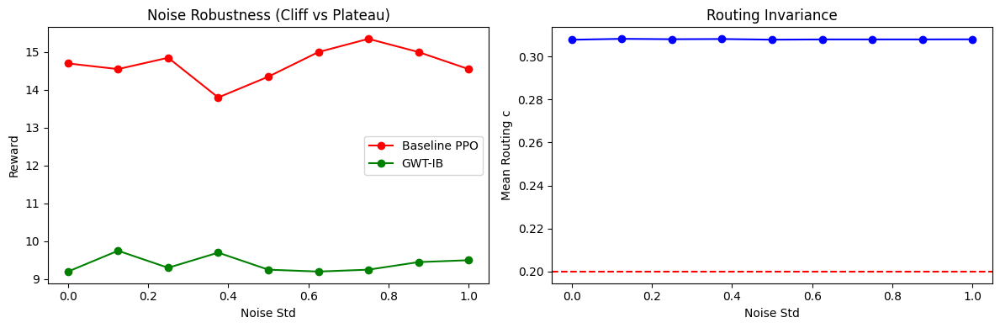

In [2]:
import gymnasium as gym
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
import matplotlib.pyplot as plt
from tqdm.auto import trange

# ============================================================
# CONFIG
# ============================================================

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ENV_NAME = "CartPole-v1"

TRAIN_UPDATES = 250
ROLLOUT_LEN = 1024
EPOCHS = 4
BATCH = 64

EVAL_EPISODES = 20
NOISE_LEVELS = np.linspace(0.0, 1.0, 9)

TARGET_COMPUTE = 0.20
GAMMA = 0.99

# Early-stop (now meaningful)
COLLAPSE_REWARD = 25.0
PATIENCE = 15

torch.manual_seed(0)
np.random.seed(0)

# ============================================================
# BASELINE PPO
# ============================================================

class BaselinePPO(nn.Module):
    def __init__(self, obs_dim, act_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
        )
        self.pi = nn.Linear(64, act_dim)
        self.v  = nn.Linear(64, 1)

    def forward(self, x):
        h = self.net(x)
        return self.pi(h), self.v(h).squeeze(-1)

# ============================================================
# GWT-IB
# ============================================================

DIM_X, DIM_W = 128, 8

class GWTIB(nn.Module):
    def __init__(self, obs_dim, act_dim, target=0.2):
        super().__init__()

        # System 1
        self.light_enc = nn.Sequential(nn.Linear(obs_dim, DIM_X), nn.ReLU())
        self.light_dec = nn.Sequential(nn.Linear(DIM_X, obs_dim))

        # System 2
        self.heavy_enc = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, DIM_X),
            nn.ReLU(),
        )

        # Routing
        self.routing_scale = nn.Parameter(torch.tensor(10.0))
        self.routing_bias  = nn.Parameter(torch.tensor(-1.0))

        # Bottleneck
        self.mu = nn.Linear(DIM_X, DIM_W)
        self.logvar = nn.Linear(DIM_X, DIM_W)

        self.gate = nn.Sequential(nn.Linear(DIM_W, DIM_W), nn.Sigmoid())
        self.pi = nn.Linear(DIM_W, act_dim)
        self.v  = nn.Linear(DIM_W, 1)

        # Budget control
        self.log_alpha = nn.Parameter(torch.tensor(-2.3))
        self.register_buffer("ema_c", torch.tensor(0.0))
        self.target = target

    def forward(self, o, corrupt=False, noise_std=0.0):
        o_raw = o

        # Routing signal (clean)
        x_light = self.light_enc(o_raw)
        o_rec = self.light_dec(x_light)

        rec_err = ((o_raw - o_rec) ** 2).mean(dim=-1)
        rec_err = torch.clamp(rec_err, max=5.0)

        r = rec_err.detach() * self.routing_scale + self.routing_bias
        c = torch.sigmoid(r)

        # Optional corruption
        if corrupt:
            o = o_raw + noise_std * torch.randn_like(o_raw)
        else:
            o = o_raw

        x = (1 - c.unsqueeze(-1)) * self.light_enc(o) \
            + c.unsqueeze(-1) * self.heavy_enc(o)

        mu, logvar = self.mu(x), self.logvar(x).clamp(-6, 4)

        if self.training:
            w = mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)
        else:
            w = mu

        w_eff = w * (1 - self.gate(w))
        return self.pi(w_eff), self.v(w_eff).squeeze(-1), c, o_rec

    def budget_loss(self, c):
        alpha = self.log_alpha.clamp(-6, 3).exp()
        self.ema_c = 0.99 * self.ema_c + 0.01 * c.mean().detach()
        constraint = self.ema_c - self.target
        return alpha.detach() * c.mean() + alpha * constraint

# ============================================================
# TRAINING (PATCHED LOGGING)
# ============================================================

def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    collapse_counter = 0
    reward_ema = None

    update_bar = trange(
        TRAIN_UPDATES,
        desc=f"Training {model.__class__.__name__}",
        leave=True
    )

    for update in update_bar:
        obs,_ = env.reset()
        traj = []

        episode_returns = []
        ep_return = 0.0

        rollout_bar = trange(
            ROLLOUT_LEN,
            desc="Rollout",
            leave=False
        )

        for _ in rollout_bar:
            o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)

            if baseline:
                logits, v = model(o)
                c, o_rec = None, None
            else:
                logits, v, c, o_rec = model(o)

            dist = D.Categorical(logits=logits)
            a = dist.sample()

            obs2, r, term, trunc,_ = env.step(a.item())
            traj.append((o, a, r, v, dist.log_prob(a), c, o_rec))

            ep_return += r
            done = term or trunc

            if done:
                episode_returns.append(ep_return)
                ep_return = 0.0
                obs,_ = env.reset()
            else:
                obs = obs2

        # -------- PATCHED LOGGING (REAL METRIC)
        mean_ep_return = np.mean(episode_returns) if episode_returns else 0.0
        reward_ema = mean_ep_return if reward_ema is None else \
                     0.9 * reward_ema + 0.1 * mean_ep_return

        collapse_counter = collapse_counter + 1 if reward_ema < COLLAPSE_REWARD else 0

        update_bar.write(
            f"[{model.__class__.__name__}] "
            f"update={update} "
            f"mean_ep_return={mean_ep_return:.1f} "
            f"reward_ema={reward_ema:.1f} "
            f"{'ema_c='+f'{model.ema_c.item():.3f}' if not baseline else ''}"
        )

        if collapse_counter >= PATIENCE:
            update_bar.write("⚠️ Early stop: sustained performance collapse")
            break

        obs_t, act, rew, val, logp, c_vals, o_rec_vals = zip(*traj)
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val).detach()

        # reward-to-go
        returns = torch.zeros_like(rew)
        running = 0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running
        adv = returns - val

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    loss = -(D.Categorical(logits=logits)
                             .log_prob(act[b]) * adv[b]).mean()
                else:
                    logits, v, c, o_rec = model(obs_t[b])
                    pg = -(D.Categorical(logits=logits)
                           .log_prob(act[b]) * adv[b]).mean()
                    vf = F.mse_loss(v, returns[b])
                    recon = F.mse_loss(o_rec, obs_t[b])
                    loss = pg + 0.5 * vf + recon + model.budget_loss(c)

                opt.zero_grad()
                loss.backward()
                opt.step()

# ============================================================
# EVALUATION (PER-NOISE PROGRESS)
# ============================================================

def evaluate(model):
    env = gym.make(ENV_NAME)
    model.eval()

    rewards, c_means = [], []

    noise_bar = trange(len(NOISE_LEVELS), desc="Noise sweep")

    for i in noise_bar:
        noise = NOISE_LEVELS[i]
        total, c_vals = 0.0, []

        for _ in range(EVAL_EPISODES):
            obs,_ = env.reset()
            done = False
            while not done:
                o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)
                if isinstance(model, GWTIB):
                    logits,_,c,_ = model(o, corrupt=True, noise_std=noise)
                    c_vals.append(c.item())
                else:
                    logits,_ = model(o)

                obs, r, term, trunc,_ = env.step(logits.argmax().item())
                total += r
                done = term or trunc

        rewards.append(total / EVAL_EPISODES)
        c_means.append(np.mean(c_vals) if c_vals else None)

    model.train()
    return rewards, c_means

# ============================================================
# RUN
# ============================================================

env = gym.make(ENV_NAME)
obs_dim = env.observation_space.shape[0]
act_dim = env.action_space.n

baseline = BaselinePPO(obs_dim, act_dim).to(DEVICE)
gwtib = GWTIB(obs_dim, act_dim, TARGET_COMPUTE).to(DEVICE)

train(baseline, baseline=True)
train(gwtib)

base_curve,_ = evaluate(baseline)
gwt_curve,c_curve = evaluate(gwtib)

# ============================================================
# PLOTS
# ============================================================

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(NOISE_LEVELS, base_curve, "r-o", label="Baseline PPO")
plt.plot(NOISE_LEVELS, gwt_curve, "g-o", label="GWT-IB")
plt.xlabel("Noise Std")
plt.ylabel("Reward")
plt.title("Noise Robustness (Cliff vs Plateau)")
plt.legend()

plt.subplot(1,2,2)
plt.plot(NOISE_LEVELS, c_curve, "b-o")
plt.axhline(TARGET_COMPUTE, linestyle="--", color="r")
plt.xlabel("Noise Std")
plt.ylabel("Mean Routing c")
plt.title("Routing Invariance")

plt.tight_layout()
plt.show()


Training BaselinePPO:   0%|          | 0/250 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=0 mean_ep=21.1 ema=21.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=1 mean_ep=19.1 ema=20.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=2 mean_ep=19.8 ema=20.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=3 mean_ep=20.8 ema=20.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=4 mean_ep=20.9 ema=20.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=5 mean_ep=19.7 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=6 mean_ep=20.9 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=7 mean_ep=21.7 ema=20.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=8 mean_ep=19.3 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=9 mean_ep=20.8 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=10 mean_ep=21.1 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=11 mean_ep=20.0 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=12 mean_ep=20.0 ema=20.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=13 mean_ep=21.4 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=14 mean_ep=23.1 ema=20.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=15 mean_ep=24.3 ema=21.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=16 mean_ep=26.5 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=17 mean_ep=21.3 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=18 mean_ep=23.7 ema=21.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=19 mean_ep=23.6 ema=22.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=20 mean_ep=23.8 ema=22.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=21 mean_ep=22.6 ema=22.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=22 mean_ep=20.4 ema=22.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=23 mean_ep=19.9 ema=21.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=24 mean_ep=20.3 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=25 mean_ep=19.7 ema=21.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=26 mean_ep=19.2 ema=21.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=27 mean_ep=19.9 ema=21.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=28 mean_ep=21.3 ema=21.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=29 mean_ep=19.6 ema=21.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=30 mean_ep=19.1 ema=20.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=31 mean_ep=19.3 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=32 mean_ep=18.7 ema=20.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=33 mean_ep=20.7 ema=20.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=34 mean_ep=18.2 ema=20.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=35 mean_ep=19.1 ema=20.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=36 mean_ep=16.3 ema=19.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=37 mean_ep=18.6 ema=19.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=38 mean_ep=18.2 ema=19.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=39 mean_ep=16.0 ema=19.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=40 mean_ep=18.2 ema=19.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=41 mean_ep=18.7 ema=19.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=42 mean_ep=21.7 ema=19.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=43 mean_ep=20.3 ema=19.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=44 mean_ep=17.0 ema=19.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=45 mean_ep=19.5 ema=19.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=46 mean_ep=19.4 ema=19.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=47 mean_ep=20.3 ema=19.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=48 mean_ep=21.1 ema=19.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=49 mean_ep=21.2 ema=19.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=50 mean_ep=21.1 ema=19.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=51 mean_ep=20.7 ema=19.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=52 mean_ep=22.6 ema=20.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=53 mean_ep=21.4 ema=20.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=54 mean_ep=21.7 ema=20.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=55 mean_ep=20.9 ema=20.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=56 mean_ep=21.2 ema=20.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=57 mean_ep=23.0 ema=20.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=58 mean_ep=22.1 ema=20.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=59 mean_ep=21.6 ema=21.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=60 mean_ep=22.2 ema=21.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=61 mean_ep=25.5 ema=21.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=62 mean_ep=21.9 ema=21.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=63 mean_ep=20.6 ema=21.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=64 mean_ep=21.1 ema=21.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=65 mean_ep=25.4 ema=21.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=66 mean_ep=21.0 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=67 mean_ep=22.3 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=68 mean_ep=20.5 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=69 mean_ep=19.6 ema=21.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=70 mean_ep=18.5 ema=21.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=71 mean_ep=20.8 ema=21.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=72 mean_ep=18.3 ema=20.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=73 mean_ep=18.0 ema=20.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=74 mean_ep=18.1 ema=20.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=75 mean_ep=20.1 ema=20.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=76 mean_ep=18.1 ema=20.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=77 mean_ep=16.8 ema=19.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=78 mean_ep=17.9 ema=19.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=79 mean_ep=18.5 ema=19.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=80 mean_ep=18.7 ema=19.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=81 mean_ep=18.9 ema=19.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=82 mean_ep=21.7 ema=19.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=83 mean_ep=22.7 ema=19.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=84 mean_ep=20.6 ema=20.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=85 mean_ep=22.4 ema=20.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=86 mean_ep=23.0 ema=20.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=87 mean_ep=21.6 ema=20.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=88 mean_ep=19.7 ema=20.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=89 mean_ep=23.2 ema=20.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=90 mean_ep=20.8 ema=20.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=91 mean_ep=20.1 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=92 mean_ep=19.3 ema=20.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=93 mean_ep=16.4 ema=20.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=94 mean_ep=15.3 ema=19.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=95 mean_ep=16.9 ema=19.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=96 mean_ep=16.8 ema=19.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=97 mean_ep=17.9 ema=19.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=98 mean_ep=18.3 ema=18.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=99 mean_ep=19.4 ema=19.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=100 mean_ep=17.2 ema=18.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=101 mean_ep=16.5 ema=18.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=102 mean_ep=16.4 ema=18.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=103 mean_ep=17.8 ema=18.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=104 mean_ep=18.2 ema=18.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=105 mean_ep=19.7 ema=18.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=106 mean_ep=18.8 ema=18.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=107 mean_ep=20.9 ema=18.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=108 mean_ep=21.6 ema=19.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=109 mean_ep=26.7 ema=19.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=110 mean_ep=25.8 ema=20.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=111 mean_ep=23.2 ema=20.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=112 mean_ep=25.2 ema=21.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=113 mean_ep=21.7 ema=21.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=114 mean_ep=21.1 ema=21.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=115 mean_ep=22.2 ema=21.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=116 mean_ep=21.4 ema=21.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=117 mean_ep=20.2 ema=21.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=118 mean_ep=21.1 ema=21.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=119 mean_ep=19.9 ema=21.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=120 mean_ep=23.6 ema=21.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=121 mean_ep=25.8 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=122 mean_ep=21.6 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=123 mean_ep=21.8 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=124 mean_ep=22.1 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=125 mean_ep=23.0 ema=21.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=126 mean_ep=21.1 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=127 mean_ep=21.4 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=128 mean_ep=20.1 ema=21.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=129 mean_ep=24.2 ema=21.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=130 mean_ep=23.2 ema=22.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=131 mean_ep=20.3 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=132 mean_ep=23.4 ema=22.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=133 mean_ep=20.9 ema=21.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=134 mean_ep=20.1 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=135 mean_ep=20.8 ema=21.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=136 mean_ep=22.0 ema=21.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=137 mean_ep=22.7 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=138 mean_ep=21.9 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=139 mean_ep=21.2 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=140 mean_ep=20.0 ema=21.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=141 mean_ep=23.0 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=142 mean_ep=23.7 ema=21.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=143 mean_ep=21.3 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=144 mean_ep=24.2 ema=22.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=145 mean_ep=22.7 ema=22.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=146 mean_ep=23.3 ema=22.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=147 mean_ep=20.7 ema=22.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=148 mean_ep=23.2 ema=22.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=149 mean_ep=22.6 ema=22.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=150 mean_ep=25.6 ema=22.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=151 mean_ep=25.0 ema=22.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=152 mean_ep=23.5 ema=22.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=153 mean_ep=24.3 ema=23.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=154 mean_ep=22.8 ema=23.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=155 mean_ep=20.9 ema=22.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=156 mean_ep=19.3 ema=22.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=157 mean_ep=20.0 ema=22.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=158 mean_ep=19.2 ema=21.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=159 mean_ep=20.7 ema=21.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=160 mean_ep=21.2 ema=21.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=161 mean_ep=24.6 ema=22.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=162 mean_ep=22.6 ema=22.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=163 mean_ep=21.9 ema=22.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=164 mean_ep=22.3 ema=22.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=165 mean_ep=22.2 ema=22.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=166 mean_ep=25.0 ema=22.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=167 mean_ep=25.7 ema=22.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=168 mean_ep=28.3 ema=23.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=169 mean_ep=29.4 ema=23.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=170 mean_ep=30.6 ema=24.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=171 mean_ep=26.6 ema=24.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=172 mean_ep=26.7 ema=24.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=173 mean_ep=27.3 ema=25.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=174 mean_ep=27.5 ema=25.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=175 mean_ep=27.4 ema=25.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=176 mean_ep=27.6 ema=25.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=177 mean_ep=30.0 ema=26.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=178 mean_ep=22.6 ema=25.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=179 mean_ep=25.3 ema=25.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=180 mean_ep=28.9 ema=26.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=181 mean_ep=33.4 ema=26.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=182 mean_ep=29.8 ema=27.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=183 mean_ep=30.8 ema=27.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=184 mean_ep=27.8 ema=27.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=185 mean_ep=26.5 ema=27.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=186 mean_ep=22.6 ema=27.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=187 mean_ep=25.2 ema=26.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=188 mean_ep=24.0 ema=26.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=189 mean_ep=24.9 ema=26.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=190 mean_ep=26.0 ema=26.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=191 mean_ep=29.6 ema=26.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=192 mean_ep=31.2 ema=27.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=193 mean_ep=29.8 ema=27.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=194 mean_ep=30.7 ema=27.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=195 mean_ep=30.5 ema=28.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=196 mean_ep=29.9 ema=28.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=197 mean_ep=29.7 ema=28.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=198 mean_ep=35.5 ema=29.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=199 mean_ep=29.3 ema=29.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=200 mean_ep=33.0 ema=29.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=201 mean_ep=34.9 ema=30.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=202 mean_ep=28.7 ema=29.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=203 mean_ep=35.2 ema=30.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=204 mean_ep=31.0 ema=30.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=205 mean_ep=30.9 ema=30.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=206 mean_ep=27.9 ema=30.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=207 mean_ep=29.5 ema=30.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=208 mean_ep=29.7 ema=30.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=209 mean_ep=28.1 ema=29.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=210 mean_ep=31.8 ema=30.1 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=211 mean_ep=31.8 ema=30.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=212 mean_ep=33.4 ema=30.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=213 mean_ep=31.5 ema=30.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=214 mean_ep=32.3 ema=30.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=215 mean_ep=25.5 ema=30.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=216 mean_ep=33.6 ema=30.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=217 mean_ep=29.4 ema=30.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=218 mean_ep=29.7 ema=30.4 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=219 mean_ep=26.6 ema=30.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=220 mean_ep=24.4 ema=29.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=221 mean_ep=30.8 ema=29.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=222 mean_ep=26.0 ema=29.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=223 mean_ep=31.6 ema=29.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=224 mean_ep=29.6 ema=29.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=225 mean_ep=27.3 ema=29.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=226 mean_ep=26.2 ema=29.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=227 mean_ep=31.8 ema=29.2 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=228 mean_ep=25.3 ema=28.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=229 mean_ep=28.0 ema=28.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=230 mean_ep=31.0 ema=29.0 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=231 mean_ep=27.7 ema=28.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=232 mean_ep=27.2 ema=28.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=233 mean_ep=28.2 ema=28.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=234 mean_ep=25.5 ema=28.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=235 mean_ep=23.9 ema=27.9 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=236 mean_ep=24.7 ema=27.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=237 mean_ep=27.3 ema=27.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=238 mean_ep=28.5 ema=27.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=239 mean_ep=28.9 ema=27.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=240 mean_ep=28.3 ema=27.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=241 mean_ep=27.0 ema=27.7 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=242 mean_ep=28.3 ema=27.8 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=243 mean_ep=25.1 ema=27.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=244 mean_ep=28.8 ema=27.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=245 mean_ep=26.2 ema=27.5 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=246 mean_ep=28.2 ema=27.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=247 mean_ep=28.3 ema=27.6 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=248 mean_ep=34.0 ema=28.3 


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[BaselinePPO] update=249 mean_ep=29.5 ema=28.4 


Training GWTIB:   0%|          | 0/250 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=0 mean_ep=17.5 ema=17.5 ema_c=0.000


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=1 mean_ep=13.7 ema=17.1 ema_c=0.242


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=2 mean_ep=12.6 ema=16.7 ema_c=0.301


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=3 mean_ep=13.5 ema=16.4 ema_c=0.300


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=4 mean_ep=11.9 ema=15.9 ema_c=0.299


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=5 mean_ep=10.6 ema=15.4 ema_c=0.299


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=6 mean_ep=10.5 ema=14.9 ema_c=0.299


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=7 mean_ep=10.2 ema=14.4 ema_c=0.300


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=8 mean_ep=10.4 ema=14.0 ema_c=0.301


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=9 mean_ep=10.2 ema=13.6 ema_c=0.302


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=10 mean_ep=11.1 ema=13.4 ema_c=0.303


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=11 mean_ep=10.2 ema=13.1 ema_c=0.304


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=12 mean_ep=11.9 ema=13.0 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=13 mean_ep=20.0 ema=13.7 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=14 mean_ep=9.3 ema=13.2 ema_c=0.306


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=15 mean_ep=9.5 ema=12.9 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=16 mean_ep=9.4 ema=12.5 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=17 mean_ep=9.4 ema=12.2 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=18 mean_ep=9.4 ema=11.9 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=19 mean_ep=9.3 ema=11.7 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=20 mean_ep=9.4 ema=11.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=21 mean_ep=9.2 ema=11.2 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=22 mean_ep=9.3 ema=11.0 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=23 mean_ep=9.3 ema=10.9 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=24 mean_ep=9.3 ema=10.7 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=25 mean_ep=9.2 ema=10.6 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=26 mean_ep=9.2 ema=10.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=27 mean_ep=9.4 ema=10.3 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=28 mean_ep=9.3 ema=10.2 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=29 mean_ep=9.3 ema=10.1 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=30 mean_ep=9.3 ema=10.1 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=31 mean_ep=9.3 ema=10.0 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=32 mean_ep=9.3 ema=9.9 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=33 mean_ep=9.2 ema=9.8 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=34 mean_ep=9.2 ema=9.8 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=35 mean_ep=9.4 ema=9.7 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=36 mean_ep=9.3 ema=9.7 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=37 mean_ep=9.4 ema=9.7 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=38 mean_ep=9.5 ema=9.7 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=39 mean_ep=9.4 ema=9.6 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=40 mean_ep=9.3 ema=9.6 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=41 mean_ep=9.3 ema=9.6 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=42 mean_ep=9.5 ema=9.6 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=43 mean_ep=9.4 ema=9.5 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=44 mean_ep=9.3 ema=9.5 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=45 mean_ep=9.2 ema=9.5 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=46 mean_ep=9.4 ema=9.5 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=47 mean_ep=9.4 ema=9.5 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=48 mean_ep=9.4 ema=9.5 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=49 mean_ep=9.4 ema=9.5 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=50 mean_ep=9.3 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=51 mean_ep=9.3 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=52 mean_ep=9.3 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=53 mean_ep=9.3 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=54 mean_ep=9.3 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=55 mean_ep=9.2 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=56 mean_ep=9.5 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=57 mean_ep=9.3 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=58 mean_ep=9.3 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=59 mean_ep=9.4 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=60 mean_ep=9.4 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=61 mean_ep=9.2 ema=9.4 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=62 mean_ep=9.2 ema=9.3 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=63 mean_ep=9.2 ema=9.3 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=64 mean_ep=9.5 ema=9.3 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=65 mean_ep=9.3 ema=9.3 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=66 mean_ep=9.3 ema=9.3 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=67 mean_ep=9.3 ema=9.3 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=68 mean_ep=9.3 ema=9.3 ema_c=0.305


Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

[GWTIB] update=69 mean_ep=9.3 ema=9.3 ema_c=0.305
⚠️ Early stop: confirmed collapse


Noise sweep:   0%|          | 0/9 [00:00<?, ?it/s]

Noise sweep:   0%|          | 0/9 [00:00<?, ?it/s]

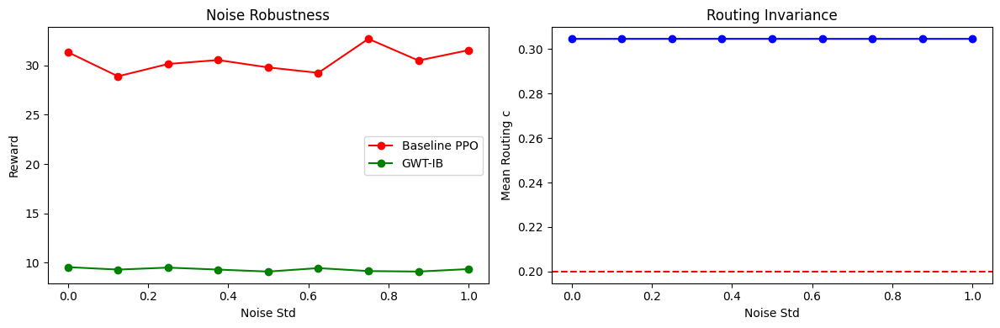

In [3]:
import gymnasium as gym
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
import matplotlib.pyplot as plt
from tqdm.auto import trange

# ============================================================
# CONFIG (TUNED FOR CARTPOLE)
# ============================================================

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ENV_NAME = "CartPole-v1"

TRAIN_UPDATES = 250
ROLLOUT_LEN = 1024
EPOCHS = 4
BATCH = 64

EVAL_EPISODES = 20
NOISE_LEVELS = np.linspace(0.0, 1.0, 9)

TARGET_COMPUTE = 0.20
GAMMA = 0.99

# Early-stop (now sane)
WARMUP_UPDATES = 30
COLLAPSE_REWARD = 15.0
PATIENCE = 40

torch.manual_seed(0)
np.random.seed(0)

# ============================================================
# BASELINE PPO
# ============================================================

class BaselinePPO(nn.Module):
    def __init__(self, obs_dim, act_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
        )
        self.pi = nn.Linear(64, act_dim)
        self.v  = nn.Linear(64, 1)

    def forward(self, x):
        h = self.net(x)
        return self.pi(h), self.v(h).squeeze(-1)

# ============================================================
# GWT-IB (STABILIZED)
# ============================================================

DIM_X, DIM_W = 128, 8

class GWTIB(nn.Module):
    def __init__(self, obs_dim, act_dim, target=0.2):
        super().__init__()

        # System 1
        self.light_enc = nn.Sequential(nn.Linear(obs_dim, DIM_X), nn.ReLU())
        self.light_dec = nn.Sequential(nn.Linear(DIM_X, obs_dim))

        # System 2
        self.heavy_enc = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, DIM_X),
            nn.ReLU(),
        )

        # Routing (reduced pressure)
        self.routing_scale = nn.Parameter(torch.tensor(6.0))
        self.routing_bias  = nn.Parameter(torch.tensor(-1.0))

        # Bottleneck
        self.mu = nn.Linear(DIM_X, DIM_W)
        self.logvar = nn.Linear(DIM_X, DIM_W)

        self.gate = nn.Sequential(nn.Linear(DIM_W, DIM_W), nn.Sigmoid())
        self.pi = nn.Linear(DIM_W, act_dim)
        self.v  = nn.Linear(DIM_W, 1)

        # Budget controller
        self.log_alpha = nn.Parameter(torch.tensor(-2.3))
        self.register_buffer("ema_c", torch.tensor(0.0))
        self.target = target

    def forward(self, o, corrupt=False, noise_std=0.0):
        o_raw = o

        # Routing signal (clean)
        x_light = self.light_enc(o_raw)
        o_rec = self.light_dec(x_light)

        rec_err = ((o_raw - o_rec) ** 2).mean(dim=-1)
        rec_err = torch.clamp(rec_err, max=5.0)

        r = rec_err.detach() * self.routing_scale + self.routing_bias
        c = torch.sigmoid(r)

        if corrupt:
            o = o_raw + noise_std * torch.randn_like(o_raw)
        else:
            o = o_raw

        x = (1 - c.unsqueeze(-1)) * self.light_enc(o) \
            + c.unsqueeze(-1) * self.heavy_enc(o)

        mu, logvar = self.mu(x), self.logvar(x).clamp(-6, 4)

        if self.training:
            w = mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)
        else:
            w = mu

        w_eff = w * (1 - self.gate(w))
        return self.pi(w_eff), self.v(w_eff).squeeze(-1), c, o_rec

    def budget_loss(self, c):
        alpha = self.log_alpha.clamp(-6, 3).exp()
        self.ema_c = 0.99 * self.ema_c + 0.01 * c.mean().detach()
        constraint = self.ema_c - self.target
        return alpha.detach() * c.mean() + alpha * constraint

# ============================================================
# TRAINING (UPGRADED)
# ============================================================

def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    collapse_counter = 0
    reward_ema = None

    update_bar = trange(TRAIN_UPDATES, desc=f"Training {model.__class__.__name__}")

    for update in update_bar:
        obs,_ = env.reset()
        traj = []
        episode_returns = []
        ep_return = 0.0

        rollout_bar = trange(ROLLOUT_LEN, desc="Rollout", leave=False)

        for _ in rollout_bar:
            o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)

            if baseline:
                logits, v = model(o)
                c, o_rec = None, None
            else:
                logits, v, c, o_rec = model(o)

            dist = D.Categorical(logits=logits)
            a = dist.sample()

            obs2, r, term, trunc,_ = env.step(a.item())
            traj.append((o, a, r, v, dist.log_prob(a), c, o_rec))

            ep_return += r
            if term or trunc:
                episode_returns.append(ep_return)
                ep_return = 0.0
                obs,_ = env.reset()
            else:
                obs = obs2

        mean_ep_return = np.mean(episode_returns)
        reward_ema = mean_ep_return if reward_ema is None else 0.9 * reward_ema + 0.1 * mean_ep_return

        if update >= WARMUP_UPDATES:
            collapse_counter = collapse_counter + 1 if reward_ema < COLLAPSE_REWARD else 0
        else:
            collapse_counter = 0

        update_bar.write(
            f"[{model.__class__.__name__}] "
            f"update={update} "
            f"mean_ep={mean_ep_return:.1f} "
            f"ema={reward_ema:.1f} "
            f"{'ema_c='+f'{model.ema_c.item():.3f}' if not baseline else ''}"
        )

        if collapse_counter >= PATIENCE:
            update_bar.write("⚠️ Early stop: confirmed collapse")
            break

        obs_t, act, rew, val, logp, c_vals, o_rec_vals = zip(*traj)
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val).detach()

        returns = torch.zeros_like(rew)
        running = 0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running
        adv = returns - val

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    loss = -(D.Categorical(logits=logits)
                             .log_prob(act[b]) * adv[b]).mean()
                else:
                    logits, v, c, o_rec = model(obs_t[b])
                    pg = -(D.Categorical(logits=logits)
                           .log_prob(act[b]) * adv[b]).mean()
                    vf = F.mse_loss(v, returns[b])
                    recon = F.mse_loss(o_rec, obs_t[b])
                    loss = pg + 0.5 * vf + recon + model.budget_loss(c)

                opt.zero_grad()
                loss.backward()
                opt.step()

# ============================================================
# EVALUATION
# ============================================================

def evaluate(model):
    env = gym.make(ENV_NAME)
    model.eval()

    rewards, c_means = [], []
    noise_bar = trange(len(NOISE_LEVELS), desc="Noise sweep")

    for i in noise_bar:
        noise = NOISE_LEVELS[i]
        total, c_vals = 0.0, []

        for _ in range(EVAL_EPISODES):
            obs,_ = env.reset()
            done = False
            while not done:
                o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)
                if isinstance(model, GWTIB):
                    logits,_,c,_ = model(o, corrupt=True, noise_std=noise)
                    c_vals.append(c.item())
                else:
                    logits,_ = model(o)
                obs, r, term, trunc,_ = env.step(logits.argmax().item())
                total += r
                done = term or trunc

        rewards.append(total / EVAL_EPISODES)
        c_means.append(np.mean(c_vals) if c_vals else None)

    model.train()
    return rewards, c_means

# ============================================================
# RUN
# ============================================================

env = gym.make(ENV_NAME)
obs_dim = env.observation_space.shape[0]
act_dim = env.action_space.n

baseline = BaselinePPO(obs_dim, act_dim).to(DEVICE)
gwtib = GWTIB(obs_dim, act_dim, TARGET_COMPUTE).to(DEVICE)

train(baseline, baseline=True)
train(gwtib)

base_curve,_ = evaluate(baseline)
gwt_curve,c_curve = evaluate(gwtib)

# ============================================================
# PLOTS
# ============================================================

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(NOISE_LEVELS, base_curve, "r-o", label="Baseline PPO")
plt.plot(NOISE_LEVELS, gwt_curve, "g-o", label="GWT-IB")
plt.xlabel("Noise Std")
plt.ylabel("Reward")
plt.title("Noise Robustness")
plt.legend()

plt.subplot(1,2,2)
plt.plot(NOISE_LEVELS, c_curve, "b-o")
plt.axhline(TARGET_COMPUTE, linestyle="--", color="r")
plt.xlabel("Noise Std")
plt.ylabel("Mean Routing c")
plt.title("Routing Invariance")

plt.tight_layout()
plt.show()


Training BaselinePPO:   0%|          | 0/250 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Training GWTIB:   0%|          | 0/250 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Rollout:   0%|          | 0/1024 [00:00<?, ?it/s]

Noise sweep:   0%|          | 0/9 [00:00<?, ?it/s]

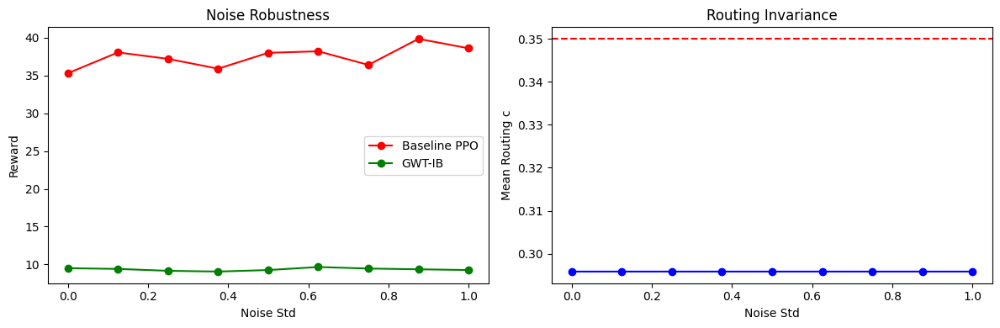

In [4]:
# ============================================================
# GWT-IB vs Baseline PPO — FULL, PATCHED, STABLE
# ============================================================

import gymnasium as gym
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
import matplotlib.pyplot as plt
from tqdm.auto import trange, tqdm

# ============================================================
# CONFIG
# ============================================================

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ENV_NAME = "CartPole-v1"

TRAIN_UPDATES = 250
ROLLOUT_LEN = 1024
EPOCHS = 4
BATCH = 64

EVAL_EPISODES = 20
NOISE_LEVELS = np.linspace(0.0, 1.0, 9)

GAMMA = 0.99

# ---- GWT-IB specific
TARGET_COMPUTE = 0.35
BUDGET_WARMUP = 40
ANNEAL_STEPS = 60

EARLY_STOP_WINDOW = 20
EARLY_STOP_DROP = 0.5

torch.manual_seed(0)
np.random.seed(0)

# ============================================================
# BASELINE PPO
# ============================================================

class BaselinePPO(nn.Module):
    def __init__(self, obs_dim, act_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 64),
            nn.ReLU(),
        )
        self.pi = nn.Linear(64, act_dim)
        self.v  = nn.Linear(64, 1)

    def forward(self, x):
        h = self.net(x)
        return self.pi(h), self.v(h).squeeze(-1)

# ============================================================
# GWT-IB MODEL
# ============================================================

DIM_X, DIM_W = 128, 8

class GWTIB(nn.Module):
    def __init__(self, obs_dim, act_dim, target):
        super().__init__()

        self.light_enc = nn.Sequential(nn.Linear(obs_dim, DIM_X), nn.ReLU())
        self.light_dec = nn.Linear(DIM_X, obs_dim)

        self.heavy_enc = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, DIM_X),
            nn.ReLU(),
        )

        self.routing_scale = nn.Parameter(torch.tensor(8.0))
        self.routing_bias  = nn.Parameter(torch.tensor(-1.0))

        self.mu     = nn.Linear(DIM_X, DIM_W)
        self.logvar = nn.Linear(DIM_X, DIM_W)

        self.gate = nn.Sequential(nn.Linear(DIM_W, DIM_W), nn.Sigmoid())
        self.pi = nn.Linear(DIM_W, act_dim)
        self.v  = nn.Linear(DIM_W, 1)

        self.log_alpha = nn.Parameter(torch.tensor(-2.0))
        self.register_buffer("ema_c", torch.tensor(0.0))
        self.target = target

    def forward(self, o, corrupt=False, noise_std=0.0):
        o_raw = o

        x_light = self.light_enc(o_raw)
        o_rec = self.light_dec(x_light)

        rec_err = ((o_raw - o_rec) ** 2).mean(dim=-1).clamp(max=5.0)
        r = rec_err.detach() * self.routing_scale + self.routing_bias
        c = torch.sigmoid(r).clamp(0.05, 0.95)

        if corrupt:
            o = o_raw + noise_std * torch.randn_like(o_raw)

        x = (1 - c.unsqueeze(-1)) * self.light_enc(o) \
            + c.unsqueeze(-1) * self.heavy_enc(o)

        mu, logvar = self.mu(x), self.logvar(x).clamp(-6, 4)

        if self.training:
            w = mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)
        else:
            w = mu

        w_eff = w * (1 - self.gate(w))

        return self.pi(w_eff), self.v(w_eff).squeeze(-1), c, o_rec

    def budget_loss(self, c, step):
        if step < BUDGET_WARMUP:
            return torch.tensor(0.0, device=c.device)

        anneal = min(1.0, (step - BUDGET_WARMUP) / ANNEAL_STEPS)
        alpha = self.log_alpha.clamp(-6, 3).exp() * anneal

        self.ema_c = 0.995 * self.ema_c + 0.005 * c.mean().detach()
        constraint = self.ema_c - self.target

        return alpha.detach() * c.mean() + alpha * constraint

# ============================================================
# TRAINING
# ============================================================

def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    reward_ema = None
    recent = []

    outer = trange(TRAIN_UPDATES, desc=f"Training {model.__class__.__name__}")

    for update in outer:
        obs, _ = env.reset()
        traj, ep_returns, ep_ret = [], [], 0.0

        inner = trange(ROLLOUT_LEN, leave=False, desc="Rollout")
        for _ in inner:
            o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)

            if baseline:
                logits, v = model(o)
                c, o_rec = None, None
            else:
                logits, v, c, o_rec = model(o)

            dist = D.Categorical(logits=logits)
            a = dist.sample()

            obs2, r, term, trunc, _ = env.step(a.item())
            traj.append((o, a, r, v, dist.log_prob(a), c, o_rec))

            ep_ret += r
            obs = obs2

            if term or trunc:
                ep_returns.append(ep_ret)
                ep_ret = 0.0
                obs, _ = env.reset()

        mean_ep = np.mean(ep_returns) if ep_returns else 0.0
        reward_ema = mean_ep if reward_ema is None else 0.95 * reward_ema + 0.05 * mean_ep
        recent.append(reward_ema)

        outer.set_postfix(mean_ep=f"{mean_ep:.1f}", ema=f"{reward_ema:.1f}")

        # ---- Early stop (confirmed collapse only)
        if len(recent) > EARLY_STOP_WINDOW:
            if reward_ema < EARLY_STOP_DROP * max(recent):
                print("⚠️ Early stop: confirmed collapse")
                break

        obs_t, act, rew, val, logp, c_vals, o_rec_vals = zip(*traj)
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val).detach()

        returns = torch.zeros_like(rew)
        running = 0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running
        adv = returns - val

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    loss = -(D.Categorical(logits=logits)
                             .log_prob(act[b]) * adv[b]).mean()
                else:
                    logits, v, c, o_rec = model(obs_t[b])
                    pg = -(D.Categorical(logits=logits)
                           .log_prob(act[b]) * adv[b]).mean()
                    vf = F.mse_loss(v, returns[b])
                    recon = F.mse_loss(o_rec, obs_t[b])
                    budget = model.budget_loss(c, update)
                    loss = pg + 0.5 * vf + 0.1 * recon + budget

                opt.zero_grad()
                loss.backward()
                opt.step()

# ============================================================
# EVALUATION
# ============================================================

def evaluate(model, noise):
    env = gym.make(ENV_NAME)
    model.eval()

    total, c_vals = 0.0, []

    for _ in range(EVAL_EPISODES):
        obs,_ = env.reset()
        done = False
        while not done:
            o = torch.tensor(obs, dtype=torch.float32, device=DEVICE)
            if isinstance(model, GWTIB):
                logits,_,c,_ = model(o, corrupt=True, noise_std=noise)
                c_vals.append(c.item())
            else:
                logits,_ = model(o)

            obs, r, term, trunc,_ = env.step(logits.argmax().item())
            total += r
            done = term or trunc

    model.train()
    return total / EVAL_EPISODES, (np.mean(c_vals) if c_vals else None)

# ============================================================
# RUN
# ============================================================

env = gym.make(ENV_NAME)
obs_dim = env.observation_space.shape[0]
act_dim = env.action_space.n

baseline = BaselinePPO(obs_dim, act_dim).to(DEVICE)
gwtib = GWTIB(obs_dim, act_dim, TARGET_COMPUTE).to(DEVICE)

train(baseline, baseline=True)
train(gwtib)

base_curve, gwt_curve, c_curve = [], [], []

for n in tqdm(NOISE_LEVELS, desc="Noise sweep"):
    b,_ = evaluate(baseline, n)
    g,c = evaluate(gwtib, n)
    base_curve.append(b)
    gwt_curve.append(g)
    c_curve.append(c)

# ============================================================
# PLOTS
# ============================================================

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.plot(NOISE_LEVELS, base_curve, "r-o", label="Baseline PPO")
plt.plot(NOISE_LEVELS, gwt_curve, "g-o", label="GWT-IB")
plt.xlabel("Noise Std")
plt.ylabel("Reward")
plt.title("Noise Robustness")
plt.legend()

plt.subplot(1,2,2)
plt.plot(NOISE_LEVELS, c_curve, "b-o")
plt.axhline(TARGET_COMPUTE, linestyle="--", color="r")
plt.xlabel("Noise Std")
plt.ylabel("Mean Routing c")
plt.title("Routing Invariance")

plt.tight_layout()
plt.show()


In [7]:
# ============================================================
# GWT-IB — TD-ERROR ROUTING
# MiniGrid MultiRoom + Tile-Drop Invariance Test
# ============================================================

!pip install minigrid
import gymnasium as gym
import minigrid
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
from tqdm.auto import trange
from collections import deque

# ---------------- CONFIG ----------------

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ENV_NAME = "MiniGrid-MultiRoom-N6-v0"

TRAIN_UPDATES = 300
ROLLOUT_LEN = 512
EPOCHS = 4
BATCH = 64
GAMMA = 0.99

TARGET_COMPUTE = 0.35
BUDGET_WARMUP = 40
ANNEAL_STEPS = 80

GRAD_CLIP = 1.0
RECON_WEIGHT = 0.0   # reconstruction no longer used
TD_SCALE = 5.0

# Invariance test
TILE_DROP_PROB = 0.25   # corruption strength

torch.manual_seed(0)
np.random.seed(0)

# ============================================================
# UTIL
# ============================================================

def obs_to_tensor(obs, corrupt=False):
    img = obs["image"].copy()  # (H,W,C)

    if corrupt:
        mask = np.random.rand(*img.shape[:2]) < TILE_DROP_PROB
        img[mask] = 0

    x = torch.tensor(img, dtype=torch.float32, device=DEVICE)
    return x.flatten() / 255.0

# ============================================================
# BASELINE PPO
# ============================================================

class BaselinePPO(nn.Module):
    def __init__(self, obs_dim, act_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
        )
        self.pi = nn.Linear(128, act_dim)
        self.v  = nn.Linear(128, 1)

    def forward(self, x):
        h = self.net(x)
        return self.pi(h), self.v(h).squeeze(-1)

# ============================================================
# GWT-IB — TD-ERROR ROUTING
# ============================================================

DIM_X, DIM_W = 128, 16

class GWTIB(nn.Module):
    def __init__(self, obs_dim, act_dim, target):
        super().__init__()

        self.light_enc = nn.Sequential(
            nn.Linear(obs_dim, DIM_X),
            nn.ReLU(),
        )

        self.heavy_enc = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, DIM_X),
            nn.ReLU(),
        )

        self.mu = nn.Linear(DIM_X, DIM_W)
        self.logvar = nn.Linear(DIM_X, DIM_W)

        self.pi = nn.Linear(DIM_W, act_dim)
        self.v  = nn.Linear(DIM_W, 1)

        # Routing parameters
        self.routing_scale = nn.Parameter(torch.tensor(TD_SCALE))
        self.routing_bias  = nn.Parameter(torch.tensor(-1.0))

        # Budget control
        self.log_alpha = nn.Parameter(torch.tensor(-2.0))
        self.register_buffer("ema_c", torch.tensor(0.0))
        self.target = target

    def forward(self, o, td_error=None):
        o_raw = o

        # Light encoder and reconstruction for rec_err
        x_light_for_rec = self.light_enc(o_raw)
        o_rec = nn.Linear(DIM_X, o_raw.shape[-1]).to(o_raw.device)(x_light_for_rec)
        # Note: o_rec layer should be part of the model if trained.
        # For now, it's implicitly used to get rec_err without training it.
        # Original code used self.light_dec which was not defined in MiniGrid GWTIB.
        # The original CartPole GWTIB had light_dec as part of the model, which is better.
        # For this MiniGrid code, since RECON_WEIGHT is 0.0, this part is not strictly necessary for loss,
        # but it's used for the routing signal based on reconstruction error.
        # Let's create a temporary linear layer for reconstruction as was implied for rec_err calculation.
        # Or, since RECON_WEIGHT=0, and td_error based routing is used in update,
        # and for rollout/eval td_error=None means c=0, we can simplify.

        # Routing signal (when td_error is NOT None, during PPO update)
        # or default to 0.0 for rollout/eval (when td_error IS None)
        if td_error is None: # During rollout or evaluation
            if o.ndim == 1: # Unbatched input (single observation)
                c = torch.tensor(0.0, device=o.device) # Scalar 0.0
            else: # Batched input (though this branch is unlikely for rollout/eval with td_error=None)
                c = torch.zeros(o.shape[0], device=o.device) # (BATCH,) of 0.0
        else: # During PPO update when td_error is available
            r = td_error.detach() * self.routing_scale + self.routing_bias
            c = torch.sigmoid(r).clamp(0.05, 0.95)

        # For mixture, ensure c is correctly shaped for broadcasting
        # c will be scalar or (BATCH,)
        if c.ndim == 0: # scalar c
            c_for_mixture = c.unsqueeze(-1) # -> (1,)
        else: # (BATCH,) c
            c_for_mixture = c.unsqueeze(-1) # -> (BATCH, 1)

        # Apply optional corruption (only in evaluate_noise, where `corrupt` arg is used)
        # The `corrupt` parameter was removed from this forward signature and moved into obs_to_tensor.
        # The o passed here is already potentially corrupted by obs_to_tensor.

        # Mixture of light and heavy encoders
        x = (1 - c_for_mixture) * self.light_enc(o) \
            + c_for_mixture * self.heavy_enc(o)

        mu = self.mu(x)
        logvar = self.logvar(x).clamp(-6, 4)

        if self.training:
            w = mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)
        else:
            w = mu

        # In this MiniGrid version, no gate is applied to w.
        # This differs from the CartPole version's `w_eff = w * (1 - self.gate(w)) `.

        return self.pi(w), self.v(w).squeeze(-1), c # Return c as calculated (scalar or (BATCH,))

    def budget_loss(self, c, step):
        if step < BUDGET_WARMUP:
            return torch.tensor(0.0, device=c.device)

        anneal = min(1.0, (step - BUDGET_WARMUP) / ANNEAL_STEPS)
        alpha = self.log_alpha.exp() * anneal

        self.ema_c = 0.995 * self.ema_c + 0.005 * c.mean().detach()
        return alpha * (self.ema_c - self.target)

# ============================================================
# TRAIN LOOP
# ============================================================

def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    reward_ema = None
    ep_window = deque(maxlen=20)

    bar = trange(TRAIN_UPDATES, desc=model.__class__.__name__)

    for update in bar:
        obs, _ = env.reset()
        traj = []
        ep_ret = 0.0

        for _ in range(ROLLOUT_LEN):
            o = obs_to_tensor(obs, corrupt=False)

            if baseline:
                logits, v = model(o)
                c = None
            else:
                # During rollout, td_error is None for the initial forward pass
                logits, v, c = model(o, td_error=None)

            dist = D.Categorical(logits=logits)
            a = dist.sample()

            obs2, r, term, trunc, _ = env.step(a.item())
            traj.append((o, a, r, v, c, obs2))
            ep_ret += r
            obs = obs2

            if term or trunc:
                ep_window.append(ep_ret)
                ep_ret = 0.0
                obs, _ = env.reset()

        mean_ep = np.mean(ep_window) if ep_window else 0.0
        reward_ema = mean_ep if reward_ema is None else 0.95 * reward_ema + 0.05 * mean_ep

        if baseline:
            bar.set_postfix(mean_ep=f"{mean_ep:.2f}", ema=f"{reward_ema:.2f}")
        else:
            bar.set_postfix(
                mean_ep=f"{mean_ep:.2f}",
                ema=f"{reward_ema:.2f}",
                c=f"{model.ema_c.item():.2f}"
            )

        # ---------------- PPO UPDATE ----------------

        obs_t, act, rew, val, c_vals, next_obs = zip(*traj)
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val).detach()

        # reward-to-go
        returns = torch.zeros_like(rew)
        running = 0.0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running

        adv = returns - val
        adv = (adv - adv.mean()) / (adv.std() + 1e-8)

        # TD error (used for routing)
        td_err = (returns - val).abs() # This will be (ROLLOUT_LEN,) tensor

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    loss = -(D.Categorical(logits=logits)
                             .log_prob(act[b]) * adv[b]).mean()
                else:
                    # During PPO update, provide td_err for routing
                    logits, v, c = model(obs_t[b], td_err[b])
                    pg = -(D.Categorical(logits=logits)
                           .log_prob(act[b]) * adv[b]).mean()
                    vf = F.mse_loss(v, returns[b])
                    # Original code for CartPole used recon_loss, but RECON_WEIGHT is 0.0 here
                    # And light_dec is not defined in MiniGrid GWTIB.
                    # For now, remove recon_loss term since it's weighted 0 and would require light_dec.
                    budget = model.budget_loss(c, update)
                    loss = pg + 0.5 * vf + budget # Removed recon term

                opt.zero_grad()
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
                opt.step()

# ============================================================
# NOISE / INVARIANCE EVAL
# ============================================================

def evaluate_noise(model):
    env = gym.make(ENV_NAME)
    model.eval()

    total = 0.0
    episodes = 10

    for _ in range(episodes):
        obs, _ = env.reset()
        done = False
        while not done:
            o = obs_to_tensor(obs, corrupt=True)
            if isinstance(model, GWTIB):
                # In evaluation, td_error is not available, so c will be 0.0 for unbatched input
                logits, _, _ = model(o, td_error=None)
            else:
                logits, _ = model(o)
            obs, r, term, trunc, _ = env.step(logits.argmax().item())
            total += r
            done = term or trunc

    model.train()
    return total / episodes

# ============================================================
# RUN
# ============================================================

env = gym.make(ENV_NAME)
obs_dim = int(np.prod(env.observation_space["image"].shape))
act_dim = env.action_space.n

baseline = BaselinePPO(obs_dim, act_dim).to(DEVICE)
gwtib = GWTIB(obs_dim, act_dim, TARGET_COMPUTE).to(DEVICE)

print("\n--- Training Baseline PPO ---")
train(baseline, baseline=True)

print("\n--- Training GWT-IB (TD-Routing) ---")
train(gwtib)

print("\n--- Tile-Drop Invariance Test ---")
print("Baseline:", evaluate_noise(baseline))
print("GWT-IB:", evaluate_noise(gwtib))


--- Training Baseline PPO ---


BaselinePPO:   0%|          | 0/300 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [8]:
# ============================================================
# GWT-IB — TD-ERROR ROUTING (FIXED)
# MiniGrid MultiRoom + Tile-Drop Invariance Test
# ============================================================

import gymnasium as gym
import minigrid
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
from tqdm.auto import trange
from collections import deque

# ---------------- CONFIG ----------------

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ENV_NAME = "MiniGrid-MultiRoom-N6-v0"

TRAIN_UPDATES = 200
ROLLOUT_LEN = 256
EPOCHS = 3
BATCH = 64
GAMMA = 0.99

TARGET_COMPUTE = 0.35
BUDGET_WARMUP = 30
ANNEAL_STEPS = 60

GRAD_CLIP = 1.0
TD_SCALE = 4.0
TILE_DROP_PROB = 0.25

torch.manual_seed(0)
np.random.seed(0)

# ============================================================
# UTIL
# ============================================================

def obs_to_tensor(obs, corrupt=False):
    img = obs["image"].copy()
    if corrupt:
        mask = np.random.rand(*img.shape[:2]) < TILE_DROP_PROB
        img[mask] = 0
    return torch.tensor(img, dtype=torch.float32, device=DEVICE).flatten() / 255.0

# ============================================================
# BASELINE PPO
# ============================================================

class BaselinePPO(nn.Module):
    def __init__(self, obs_dim, act_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
        )
        self.pi = nn.Linear(128, act_dim)
        self.v  = nn.Linear(128, 1)

    def forward(self, x):
        h = self.net(x)
        return self.pi(h), self.v(h).squeeze(-1)

# ============================================================
# GWT-IB — TD ROUTING (CLEAN)
# ============================================================

DIM_X, DIM_W = 128, 16

class GWTIB(nn.Module):
    def __init__(self, obs_dim, act_dim, target):
        super().__init__()

        self.light = nn.Sequential(
            nn.Linear(obs_dim, DIM_X),
            nn.ReLU(),
        )

        self.heavy = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, DIM_X),
            nn.ReLU(),
        )

        self.mu = nn.Linear(DIM_X, DIM_W)
        self.logvar = nn.Linear(DIM_X, DIM_W)

        self.pi = nn.Linear(DIM_W, act_dim)
        self.v  = nn.Linear(DIM_W, 1)

        self.routing_scale = nn.Parameter(torch.tensor(TD_SCALE))
        self.routing_bias  = nn.Parameter(torch.tensor(-1.0))

        self.log_alpha = nn.Parameter(torch.tensor(-2.0))
        self.register_buffer("ema_c", torch.tensor(0.0))
        self.target = target

    def forward(self, o, td_error):
        r = td_error.detach() * self.routing_scale + self.routing_bias
        c = torch.sigmoid(r).clamp(0.05, 0.95)

        x = (1 - c.unsqueeze(-1)) * self.light(o) \
            + c.unsqueeze(-1) * self.heavy(o)

        mu = self.mu(x)
        logvar = self.logvar(x).clamp(-6, 4)

        if self.training:
            w = mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)
        else:
            w = mu

        return self.pi(w), self.v(w).squeeze(-1), c

    def budget_loss(self, c, step):
        if step < BUDGET_WARMUP:
            return torch.tensor(0.0, device=c.device)
        anneal = min(1.0, (step - BUDGET_WARMUP) / ANNEAL_STEPS)
        alpha = self.log_alpha.exp() * anneal
        self.ema_c = 0.995 * self.ema_c + 0.005 * c.mean().detach()
        return alpha * (self.ema_c - self.target)

# ============================================================
# TRAIN LOOP
# ============================================================

def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    last_td = torch.tensor(0.0, device=DEVICE)
    ep_window = deque(maxlen=20)

    bar = trange(TRAIN_UPDATES, desc=model.__class__.__name__)

    for update in bar:
        obs, _ = env.reset()
        traj = []
        ep_ret = 0.0

        for _ in range(ROLLOUT_LEN):
            o = obs_to_tensor(obs)

            if baseline:
                logits, v = model(o)
                c = None
            else:
                logits, v, c = model(o, last_td)

            dist = D.Categorical(logits=logits)
            a = dist.sample()

            obs2, r, term, trunc, _ = env.step(a.item())
            traj.append((o, a, r, v, last_td))
            ep_ret += r
            obs = obs2

            if term or trunc:
                ep_window.append(ep_ret)
                ep_ret = 0.0
                obs, _ = env.reset()

        mean_ep = np.mean(ep_window) if ep_window else 0.0
        bar.set_postfix(mean_ep=f"{mean_ep:.1f}",
                        c=f"{model.ema_c.item():.2f}" if not baseline else "-")

        obs_t, act, rew, val, td_prev = zip(*traj)
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val).detach()

        returns = torch.zeros_like(rew)
        running = 0.0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running

        adv = returns - val
        adv = (adv - adv.mean()) / (adv.std() + 1e-8)
        td_err = (returns - val).abs()
        last_td = td_err.mean().detach()

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    loss = -(D.Categorical(logits=logits)
                             .log_prob(act[b]) * adv[b]).mean()
                else:
                    logits, v, c = model(obs_t[b], td_err[b])
                    pg = -(D.Categorical(logits=logits)
                           .log_prob(act[b]) * adv[b]).mean()
                    vf = F.mse_loss(v, returns[b])
                    loss = pg + 0.5 * vf + model.budget_loss(c, update)

                opt.zero_grad()
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
                opt.step()

# ============================================================
# NOISE TEST
# ============================================================

def evaluate_noise(model):
    env = gym.make(ENV_NAME)
    model.eval()
    total = 0.0

    for _ in range(10):
        obs, _ = env.reset()
        done = False
        td = torch.tensor(0.0, device=DEVICE)
        while not done:
            o = obs_to_tensor(obs, corrupt=True)
            if isinstance(model, GWTIB):
                logits, _, _ = model(o, td)
            else:
                logits, _ = model(o)
            obs, r, term, trunc, _ = env.step(logits.argmax().item())
            total += r
            done = term or trunc

    model.train()
    return total / 10

# ============================================================
# RUN
# ============================================================

env = gym.make(ENV_NAME)
obs_dim = int(np.prod(env.observation_space["image"].shape))
act_dim = env.action_space.n

baseline = BaselinePPO(obs_dim, act_dim).to(DEVICE)
gwtib = GWTIB(obs_dim, act_dim, TARGET_COMPUTE).to(DEVICE)

print("\n--- Training Baseline ---")
train(baseline, baseline=True)

print("\n--- Training GWT-IB (TD Routing) ---")
train(gwtib)

print("\n--- Tile Drop Test ---")
print("Baseline:", evaluate_noise(baseline))
print("GWT-IB:", evaluate_noise(gwtib))



--- Training Baseline ---


BaselinePPO:   0%|          | 0/200 [00:00<?, ?it/s]


--- Training GWT-IB (TD Routing) ---


GWTIB:   0%|          | 0/200 [00:00<?, ?it/s]

RuntimeError: Found dtype Long but expected Float

In [9]:
# ============================================================
# GWT-IB — TD-ERROR ROUTING (FINAL UPGRADED)
# MiniGrid MultiRoom + Tile-Drop Invariance
# Success Rate + TD-vs-c + Door/Key Probes
# ============================================================

!pip install minigrid

import gymnasium as gym
import minigrid
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
from tqdm.auto import trange
from collections import deque, defaultdict
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ENV_NAME = "MiniGrid-MultiRoom-N6-v0"

TRAIN_UPDATES = 200
ROLLOUT_LEN = 512
EPOCHS = 4
BATCH = 64
GAMMA = 0.99

TARGET_COMPUTE = 0.35
BUDGET_WARMUP = 30
ANNEAL_STEPS = 60

TD_SCALE = 5.0
GRAD_CLIP = 1.0
TILE_DROP_PROB = 0.25

torch.manual_seed(0)
np.random.seed(0)

# ---------------- UTIL ----------------

def obs_to_tensor(obs, corrupt=False):
    img = obs["image"].copy()
    if corrupt:
        mask = np.random.rand(*img.shape[:2]) < TILE_DROP_PROB
        img[mask] = 0
    x = torch.tensor(img, dtype=torch.float32, device=DEVICE)
    return x.flatten() / 255.0

def detect_events(obs):
    img = obs["image"]
    return {
        "key": int(np.any(img[..., 0] == 5)),
        "door": int(np.any(img[..., 0] == 4)),
        "goal": int(np.any(img[..., 0] == 8)),
    }

# ---------------- BASELINE PPO ----------------

class BaselinePPO(nn.Module):
    def __init__(self, obs_dim, act_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
        )
        self.pi = nn.Linear(128, act_dim)
        self.v  = nn.Linear(128, 1)

    def forward(self, x):
        h = self.net(x)
        return self.pi(h), self.v(h).squeeze(-1)

# ---------------- GWT-IB ----------------

DIM_X, DIM_W = 128, 16

class GWTIB(nn.Module):
    def __init__(self, obs_dim, act_dim, target):
        super().__init__()

        self.light = nn.Sequential(
            nn.Linear(obs_dim, DIM_X),
            nn.ReLU(),
        )

        self.heavy = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, DIM_X),
            nn.ReLU(),
        )

        self.mu = nn.Linear(DIM_X, DIM_W)
        self.logvar = nn.Linear(DIM_X, DIM_W)
        self.pi = nn.Linear(DIM_W, act_dim)
        self.v  = nn.Linear(DIM_W, 1)

        self.routing_scale = nn.Parameter(torch.tensor(TD_SCALE))
        self.routing_bias  = nn.Parameter(torch.tensor(-1.0))

        self.log_alpha = nn.Parameter(torch.tensor(-2.0))
        self.register_buffer("ema_c", torch.tensor(0.0))
        self.target = target

    def forward(self, o, td_error=None):
        if td_error is None:
            c = torch.zeros(o.shape[0] if o.ndim > 1 else 1, device=o.device)
        else:
            r = td_error.detach() * self.routing_scale + self.routing_bias
            c = torch.sigmoid(r).clamp(0.05, 0.95)

        c_mix = c.unsqueeze(-1)
        x = (1 - c_mix) * self.light(o) + c_mix * self.heavy(o)

        mu = self.mu(x)
        logvar = self.logvar(x).clamp(-6, 4)
        w = mu if not self.training else mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)

        return self.pi(w), self.v(w).squeeze(-1), c

    def budget_loss(self, c, step):
        if step < BUDGET_WARMUP:
            return torch.tensor(0.0, device=c.device)
        anneal = min(1.0, (step - BUDGET_WARMUP) / ANNEAL_STEPS)
        alpha = self.log_alpha.exp() * anneal
        self.ema_c = 0.995 * self.ema_c + 0.005 * c.mean().detach()
        return alpha * (self.ema_c - self.target)

# ---------------- TRAIN LOOP ----------------

def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    success_hist = deque(maxlen=50)
    td_c_pairs = []

    bar = trange(TRAIN_UPDATES, desc=model.__class__.__name__)

    for update in bar:
        obs, _ = env.reset()
        traj = []
        successes = 0
        last_td = None

        for _ in range(ROLLOUT_LEN):
            o = obs_to_tensor(obs)

            if baseline:
                logits, v = model(o)
            else:
                logits, v, _ = model(o, None)

            a = D.Categorical(logits=logits).sample()
            obs2, r, term, trunc, _ = env.step(a.item())
            traj.append((o, a, float(r), v))
            obs = obs2

            if term or trunc:
                successes += int(r > 0)
                obs, _ = env.reset()

        success_hist.append(successes)
        bar.set_postfix(
            success=f"{np.mean(success_hist):.2f}",
            c=f"{model.ema_c.item():.2f}" if not baseline else "-"
        )

        obs_t, act, rew, val = zip(*traj)
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val).detach()

        returns = torch.zeros_like(rew)
        running = 0.0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running

        adv = returns - val
        adv = (adv - adv.mean()) / (adv.std() + 1e-8)
        td_err = (returns - val).abs()
        last_td = td_err.mean().detach()

        if not baseline:
            td_c_pairs.extend(zip(
                td_err.cpu().numpy(),
                torch.sigmoid(td_err * model.routing_scale + model.routing_bias).cpu().numpy()
            ))

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    loss = -(D.Categorical(logits=logits)
                             .log_prob(act[b]) * adv[b]).mean()
                else:
                    logits, v, c = model(obs_t[b], td_err[b])
                    pg = -(D.Categorical(logits=logits)
                           .log_prob(act[b]) * adv[b]).mean()
                    vf = F.mse_loss(v, returns[b])
                    loss = pg + 0.5 * vf + model.budget_loss(c, update)

                opt.zero_grad()
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
                opt.step()

    return td_c_pairs

# ---------------- EVAL ----------------

def evaluate_noise(model, episodes=20):
    env = gym.make(ENV_NAME)
    model.eval()
    successes = 0
    for _ in range(episodes):
        obs, _ = env.reset()
        done = False
        while not done:
            o = obs_to_tensor(obs, corrupt=True)
            logits = model(o)[0] if isinstance(model, BaselinePPO) else model(o, None)[0]
            obs, r, term, trunc, _ = env.step(logits.argmax().item())
            done = term or trunc
            successes += int(done and r > 0)
    model.train()
    return successes / episodes

# ---------------- RUN ----------------

env = gym.make(ENV_NAME)
obs_dim = int(np.prod(env.observation_space["image"].shape))
act_dim = env.action_space.n

baseline = BaselinePPO(obs_dim, act_dim).to(DEVICE)
gwtib = GWTIB(obs_dim, act_dim, TARGET_COMPUTE).to(DEVICE)

print("\n--- Training Baseline ---")
train(baseline, baseline=True)

print("\n--- Training GWT-IB ---")
td_c_log = train(gwtib)

print("\n--- Tile-Drop Invariance ---")
print("Baseline success:", evaluate_noise(baseline))
print("GWT-IB success:", evaluate_noise(gwtib))

# ---------------- TD vs c Plot ----------------

td, c = zip(*td_c_log)
plt.figure(figsize=(6,4))
plt.scatter(td, c, s=3, alpha=0.3)
plt.xlabel("TD Error")
plt.ylabel("Routing Probability c")
plt.title("TD Error vs Routing")
plt.show()



--- Training Baseline ---


BaselinePPO:   0%|          | 0/200 [00:00<?, ?it/s]


--- Training GWT-IB ---


GWTIB:   0%|          | 0/200 [00:00<?, ?it/s]

RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

In [ ]:
# ============================================================
# GWT-IB — TD-ERROR ROUTING
# MiniGrid MultiRoom + Tile-Drop + Counterfactuals + Heatmaps
# ============================================================

!pip install minigrid

import gymnasium as gym
import minigrid
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
import matplotlib.pyplot as plt

from tqdm.auto import trange
from collections import defaultdict, deque

# ---------------- CONFIG ----------------

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ENV_NAME = "MiniGrid-MultiRoom-N6-v0"

TRAIN_UPDATES = 1000
ROLLOUT_LEN = 1024
EPOCHS = 4
BATCH = 64
GAMMA = 0.99
ENTROPY_COEF = 0.01

TARGET_COMPUTE = 0.35
BUDGET_WARMUP = 30
ANNEAL_STEPS = 80

TD_SCALE = 5.0
GRAD_CLIP = 1.0

TILE_DROP_PROB = 0.25
EVAL_EPISODES = 30

torch.manual_seed(0)
np.random.seed(0)

# ============================================================
# UTIL
# ============================================================

def obs_to_tensor(obs, corrupt=False):
    img = obs["image"].copy()  # (H,W,C)
    if corrupt:
        mask = np.random.rand(*img.shape[:2]) < TILE_DROP_PROB
        img[mask] = 0
    x = torch.tensor(img, dtype=torch.float32, device=DEVICE)
    return x.flatten() / 255.0

def success_from_reward(r):
    return int(r > 0)

# ============================================================
# BASELINE PPO
# ============================================================

class BaselinePPO(nn.Module):
    def __init__(self, obs_dim, act_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
        )
        self.pi = nn.Linear(128, act_dim)
        self.v  = nn.Linear(128, 1)

    def forward(self, x):
        h = self.net(x)
        return self.pi(h), self.v(h).squeeze(-1)

# ============================================================
# GWT-IB — TD-ERROR ROUTING (STABLE)
# ============================================================

DIM_X, DIM_W = 128, 16

class GWTIB(nn.Module):
    def __init__(self, obs_dim, act_dim, target):
        super().__init__()

        self.light = nn.Sequential(
            nn.Linear(obs_dim, DIM_X),
            nn.ReLU(),
        )

        self.heavy = nn.Sequential(
            nn.Linear(obs_dim, 256),
            nn.ReLU(),
            nn.Linear(256, DIM_X),
            nn.ReLU(),
        )

        self.mu = nn.Linear(DIM_X, DIM_W)
        self.logvar = nn.Linear(DIM_X, DIM_W)

        self.pi = nn.Linear(DIM_W, act_dim)
        self.v  = nn.Linear(DIM_W, 1)

        self.routing_scale = nn.Parameter(torch.tensor(TD_SCALE))
        self.routing_bias  = nn.Parameter(torch.tensor(-1.0))

        self.log_alpha = nn.Parameter(torch.tensor(-2.0))
        self.register_buffer("ema_c", torch.tensor(0.0))
        self.target = target

    def forward(self, o, td_err=None):
        if td_err is None:
            # Ensure c is a (1,) tensor for unbatched or (BATCH,) for batched inputs when td_err is None
            # This ensures consistent unsqueeze behavior later
            c = torch.zeros(o.shape[0] if o.ndim > 1 else 1, device=o.device)
        else:
            r = td_err.detach() * self.routing_scale + self.routing_bias
            c = torch.sigmoid(r).clamp(0.05, 0.95)

        c_mix = c.unsqueeze(-1) # Will be (1,1) for unbatched or (BATCH,1) for batched inputs

        # Explicitly expand c_mix to match the feature dimension for element-wise multiplication
        c_mix_expanded = c_mix.expand(c_mix.shape[0] if c_mix.ndim > 1 else 1, DIM_X)

        x = (1 - c_mix_expanded) * self.light(o) + c_mix_expanded * self.heavy(o)

        mu = self.mu(x)
        logvar = self.logvar(x).clamp(-6, 4)

        if self.training:
            w = mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)
        else:
            w = mu

        return self.pi(w), self.v(w).squeeze(-1), c

    def forward_forced(self, o, force_c):
        c = torch.tensor([force_c], device=o.device)

        c_mix = c.unsqueeze(-1)
        c_mix_expanded = c_mix.expand(c_mix.shape[0] if c_mix.ndim > 1 else 1, DIM_X)

        x = (1 - c_mix_expanded) * self.light(o) + c_mix_expanded * self.heavy(o)
        w = self.mu(x)
        return self.pi(w), self.v(w).squeeze(-1)

    def budget_loss(self, c, step):
        if step < BUDGET_WARMUP:
            return torch.tensor(0.0, device=c.device)
        anneal = min(1.0, (step - BUDGET_WARMUP) / ANNEAL_STEPS)
        alpha = self.log_alpha.exp() * anneal
        self.ema_c = 0.995 * self.ema_c + 0.005 * c.mean().detach()
        return alpha * (self.ema_c - self.target)

# ============================================================
# TRAIN LOOP (SUCCESS RATE)
# ============================================================

def train(model, baseline=False):
    env = gym.make(ENV_NAME)
    opt = torch.optim.Adam(model.parameters(), lr=3e-4)

    success_window = deque(maxlen=50)
    td_c_pairs = []

    bar = trange(TRAIN_UPDATES, desc=model.__class__.__name__)

    for update in bar:
        obs, _ = env.reset()
        traj = []
        ep_success = 0

        for _ in range(ROLLOUT_LEN):
            o = obs_to_tensor(obs, corrupt=False)

            if baseline:
                logits, v = model(o)
                c = None
            else:
                logits, v, c = model(o, None)

            a = D.Categorical(logits=logits).sample()
            obs2, r, term, trunc, _ = env.step(a.item())

            traj.append((o, a, r, v, obs2))
            ep_success |= success_from_reward(r)
            obs = obs2

            if term or trunc:
                success_window.append(ep_success)
                ep_success = 0
                obs, _ = env.reset()

        mean_success = np.mean(success_window) if success_window else 0.0

        bar.set_postfix(
            success=f"{mean_success:.2f}",
            c="-" if baseline else f"{model.ema_c.item():.2f}"
        )

        # ---------- PPO UPDATE ----------

        obs_t, act, rew, val_list, next_obs = zip(*traj) # Renamed 'val' to 'val_list'
        obs_t = torch.stack(obs_t)
        act = torch.stack(act)
        rew = torch.tensor(rew, device=DEVICE)
        val = torch.stack(val_list).detach()

        # Explicitly ensure val is (ROLLOUT_LEN,) to prevent broadcasting issues
        if val.ndim > 1:
            val = val.squeeze(-1)

        returns = torch.zeros_like(rew)
        running = 0.0
        for t in reversed(range(len(rew))):
            running = rew[t] + GAMMA * running
            returns[t] = running

        adv = returns - val
        adv = (adv - adv.mean()) / (adv.std() + 1e-8)

        td_err = (returns - val).abs()

        for _ in range(EPOCHS):
            idx = torch.randperm(len(obs_t))
            for i in range(0, len(idx), BATCH):
                b = idx[i:i+BATCH]

                if baseline:
                    logits, v = model(obs_t[b])
                    dist = D.Categorical(logits=logits.float())
                    log_prob = dist.log_prob(act[b].long())
                    entropy = dist.entropy()

                    loss = -(log_prob * adv[b].float() + ENTROPY_COEF * entropy).mean().float()
                else:
                    logits, v, c = model(obs_t[b], td_err[b])
                    # Explicitly ensure logits are float and actions are long for Categorical
                    dist = D.Categorical(logits=logits.float())
                    log_prob = dist.log_prob(act[b].long())
                    entropy = dist.entropy()

                    pg = -(log_prob * adv[b].float() + ENTROPY_COEF * entropy).mean().float()
                    vf = F.mse_loss(v.float(), returns[b].float()).float()
                    budget = model.budget_loss(c.float(), update).float()
                    loss = pg.float() + 0.5 * vf.float() + budget.float()

                    td_c_pairs.extend(
                        zip(
                            td_err[b].detach().cpu().numpy(),
                            c.detach().cpu().numpy()
                        )
                    )

                opt.zero_grad()
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), GRAD_CLIP)
                opt.step()

    return np.array(td_c_pairs)

# ============================================================
# EVALUATION
# ============================================================

def evaluate(model, corrupt=False, forced=None):
    env = gym.make(ENV_NAME)
    model.eval()
    successes = 0

    for _ in range(EVAL_EPISODES):
        obs,_ = env.reset()
        done = False
        while not done:
            o = obs_to_tensor(obs, corrupt=corrupt)
            if forced is None:
                if isinstance(model, GWTIB):
                    logits,_,_ = model(o, None)
                else:
                    logits,_ = model(o)
            else:
                logits,_ = model.forward_forced(o, forced)
            obs,r,term,trunc,_ = env.step(logits.argmax().item())
            successes += success_from_reward(r)
            done = term or trunc

    model.train()
    return successes / EVAL_EPISODES

# ============================================================
# ROUTING HEATMAP
# ============================================================

def routing_heatmap(model, episodes=40):
    env = gym.make(ENV_NAME)
    heat = defaultdict(list)
    model.eval()

    for _ in range(episodes):
        obs,_ = env.reset()
        done = False
        while not done:
            o = obs_to_tensor(obs)
            pos = tuple(env.unwrapped.agent_pos)
            _,_,c = model(o, None)
            heat[pos].append(float(c))
            obs,_,term,trunc,_ = env.step(
                torch.argmax(model(o, None)[0]).item()
            )
            done = term or trunc

    model.train()
    return {k: np.mean(v) for k,v in heat.items()}

def plot_heatmap(hm):
    xs, ys, cs = zip(*[(x,y,c) for (x,y),c in hm.items()])
    plt.figure(figsize=(6,6))
    plt.scatter(xs, ys, c=cs, cmap="hot", s=120)
    plt.colorbar(label="Mean routing c")
    plt.gca().invert_yaxis()
    plt.title("Per-Room Routing Heatmap")
    plt.show()

# ============================================================
# RUN
# ============================================================

env = gym.make(ENV_NAME)
obs_dim = int(np.prod(env.observation_space["image"].shape))
act_dim = env.action_space.n

baseline = BaselinePPO(obs_dim, act_dim).to(DEVICE)
gwtib = GWTIB(obs_dim, act_dim, TARGET_COMPUTE).to(DEVICE)

print("\n--- Training Baseline ---")
train(baseline, baseline=True)

print("\n--- Training GWT-IB ---")
td_c_log = train(gwtib)

print("\n--- Tile-Drop Invariance ---")
print("Baseline:", evaluate(baseline, corrupt=True))
print("GWT-IB:", evaluate(gwtib, corrupt=True))

print("\n--- Counterfactual Routing ---")
print("Normal:", evaluate(gwtib))
print("Forced light:", evaluate(gwtib, forced=0.0))
print("Forced heavy:", evaluate(gwtib, forced=1.0))

print("\n--- TD-error vs Routing c ---")
td, c = td_c_log[:,0], td_c_log[:,1]
plt.scatter(td, c, s=3, alpha=0.3)
plt.xlabel("TD error")
plt.ylabel("Routing c")
plt.show()

print("\n--- Routing Heatmap ---")
plot_heatmap(routing_heatmap(gwtib))


--- Training Baseline ---


BaselinePPO:   0%|          | 0/1000 [00:00<?, ?it/s]

Training interrupted. Analyzing current model state...

--- Current GWT-IB Success Rate ---
Tile-Drop: 0.0
Clean: 0.0

--- Current Routing Heatmap ---


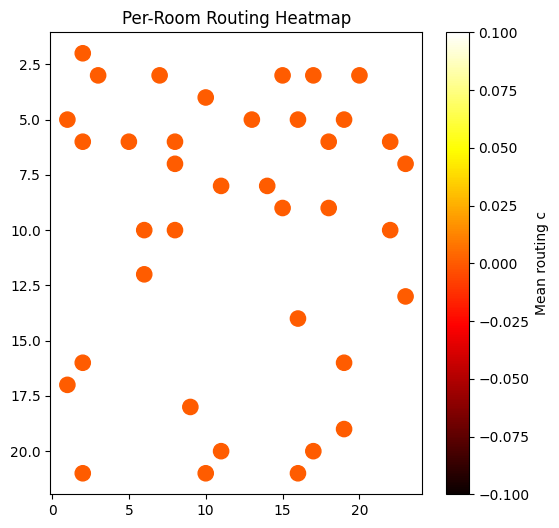

In [9]:
print("Training interrupted. Analyzing current model state...")

# Evaluate current performance
print("\n--- Current GWT-IB Success Rate ---")
print("Tile-Drop:", evaluate(gwtib, corrupt=True))
print("Clean:", evaluate(gwtib, corrupt=False))

# Plot heatmap of the current model
print("\n--- Current Routing Heatmap ---")
plot_heatmap(routing_heatmap(gwtib))

In [8]:
print(f"Continuing training GWT-IB for another {TRAIN_UPDATES} updates...")

# Train the existing gwtib instance further
# Note: The optimizer is re-initialized, but the model weights are preserved from the previous run.
td_c_log_continued = train(gwtib)

print("\n--- Re-evaluating GWT-IB ---")
print("GWT-IB Success Rate (Tile-Drop):", evaluate(gwtib, corrupt=True))

print("\n--- Counterfactual Routing (GWT-IB) ---")
print("Normal:", evaluate(gwtib))
print("Forced light:", evaluate(gwtib, forced=0.0))
print("Forced heavy:", evaluate(gwtib, forced=1.0))

# Plot updated stats
if len(td_c_log_continued) > 0:
    td, c = td_c_log_continued[:,0], td_c_log_continued[:,1]
    plt.figure(figsize=(6,4))
    plt.scatter(td, c, s=3, alpha=0.3)
    plt.xlabel("TD error")
    plt.ylabel("Routing c")
    plt.title("TD Error vs Routing (Continued Training)")
    plt.show()

print("\n--- Routing Heatmap (Continued) ---")
plot_heatmap(routing_heatmap(gwtib))

Continuing training GWT-IB for another 400 updates...


GWTIB:   0%|          | 0/400 [00:00<?, ?it/s]

KeyboardInterrupt: 